<h1 style="text-align: center;"> Subject: Depression detection based on motor activity data</h1>
<h3 style="text-align: center;"> Aiman Alam, Niloufar Shokri</h3>

---
title: "Data Mining Project"
author:
  - Niloufar Shokri
  - Aiman Alam

date: 2023-05-31

abstract: " "

format: 
  html:  
    code-fold: true
    standalone: true
    embed-resources: true
    number-sections: true # numbering the header
    toc: true
    toc-depth: 4
---


In [1]:
# Importing libraries 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import seaborn as sns
import matplotlib.mlab as mlab
from numpy.fft import fft, fftfreq

# importing classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline


from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

import warnings
warnings.filterwarnings('ignore')


## Executive Summary
<p style="text-align: justify;">
This project aimed to investigate the differences in physical activity patterns between depressed and non-depressed individuals using data collected from actigraphs. The study utilized a depression dataset containing sensor data collected from patients, with the goal of extracting relevant features and utilizing machine learning algorithms to classify and differentiate between depressed and non-depressed groups.
</p>
<p style="text-align: justify;">
The data was pre-processed by checking for missing values in each file, followed by the extraction of various features such as the average hourly activity, average weekday activity, and average activity within 6-hour intervals. Then these 55 new datasets were combined in one dataset. Exploratory Data Analysis (EDA) involved the utilization of different types of plots to identify patterns associated with depressed and non-depressed individuals. The analysis revealed that the activity data extracted from the sensor recordings showed promising potential as a feature for diagnosing depression in patients. In addition, the project incorporated the use of the tsfresh library to extract additional features from the data. These extracted features, along with the initially obtained ones, were then utilized as inputs for the machine learning model. By employing this approach, the project aimed to classify and differentiate between depressed and non-depressed groups.
The results obtained through machine learning algorithms demonstrated the feasibility of performing classification based on the available features.
</p>
<p style="text-align: justify;">
However, it is important to note that the limited number of observations in the dataset (55) may have impacted the overall reliability and generalizability of the results. The small number of observations affects the data splitting ratio for training and testing, which can influence the classification metrics. A larger dataset would improve the model's performance and enhance the robustness and accuracy of the results.
</p>
<p style="text-align: justify;"> 
Furthermore, depression is a complex mental health condition influenced by various factors, and activity level alone might not capture the complete picture. Incorporating additional information, such as psychological questionnaire data, could enhance the accuracy and reliability of the classification results.
</p>

## Introduction <a class="anchor" id="section_1"></a>
<p style="text-align: justify;">
Undeniably, the Internet of Medical Things (IoMT) is used to control the individual health. Wearable IoMT devices, such as watches which are widely used, can track users’ activities in dynamic surroundings and can deliver interventions for mental health disorders, such as defining an activity goal and encouraging the users to reach their goals by notifications, or remind them to do a meditation. Wearable activity trackers collect fine-grained sensor data characterizing the behavior and physiology of users providing objective measures of physical activity. Digital biomarkers derived from these sensor recordings an aid in the improved monitoring and detection of episodes associated with mental health disorders (Arora et al.(2023)).
</p>
<p style="text-align: justify;">
The use of on body sensors to monitor personal health has become quite normal these days. This data holds a lot of potential besides measuring the quantity of daily steps or calories burned, since continuous recordings of heart rate and activity levels usually are collected. There is an increasing awareness in the field of psychiatry on how these activity data relates to various mental health related issues such as changes in mood, personality, inability to cope with daily problems or stress and withdrawal from friends. Depression is number one of the most frequent disorders and the current trend is indicating that the prevalence will increase even more in the coming years. Dealing with depression can be demanding since it can create physically, economically and emotionally problems often leading to problems with work and sick leaves (Garcia-Ceja et. al.(2018)).
</p>
<p style="text-align: justify;"> 
The purpose of this project is to investigate the differences in physical activity patterns between depressed and non-depressed individuals using data collected from actigraphs. The study is done on the depression dataset, which contains sensor data collected from patients. In this project, different features are extracted out of these data such as the activity patterns in different days of the week and different hours of the day. Then, these features are compared between the condition and control groups to underestand the differences between them. Ultimately, we use these features as the input of machine learning classification algorithms to see if they can differenciate between depressed and non-depressed groups.
</p>

## Data Collection <a class="anchor" id="section_2"></a>
<p style="text-align: justify;"> 
Actigraphy is a quantitative method both to measure gross motor activity, and to examine diurnal variations in motor activity. <b>Motor activity</b> refers to any voluntary or involuntary movement of the body that is generated by the contraction of skeletal muscles and includes a wide range of activities such as walking, running, jumping, writing, typing, and even simple movements such as blinking and breathing. For collecting the data, motor activity was monitored with an actigraph worn at the right wrist of the chosen participents (Actiwatch, Cambridge Neurotechnology Ltd, England, model AW4). The sampling frequency is 32Hz and movements over 0.05 g are recorded. "g" refers to the acceleration due to gravity, so a movement of 0.05 g would be a small acceleration. This means that only relatively strong movements or vibrations are being recorded, while smaller or less significant movements are being ignored. A <b>corresponding voltage</b> is produced and is stored as an activity count in the memory unit of the actigraph watch. The number of counts is proportional to the intensity of the movement. Total activity counts were recorded for one minute intervals for a continuous period of two weeks. Both patients and controls were instructed to wear their actigraphs at all times except when taking a shower (Berle et al.(2010)).
</p>
<p style="text-align: justify;">
The dataset contains motor activity recordings of 23 unipolar and bipolar depressed patients and 32 healthy controls. Five subjects were hospitalized during their data collection period, and 18 were outpatients. 
</p>

### Dataset Structure <a class="anchor" id="section_2_1"></a>
<p style="text-align: justify;">
The dataset contains 2 folders of condition and control and a scores.csv file. For each patient, a csv file containing the actigraph data collected over time is provided. 
</p>

#### Condition and Control Folder <a class="anchor" id="sub_section_2_1_1"></a>
<p style="text-align: justify;">
In these folders, we have 55 csv files in total. Each csv file has three columns of: 

* timestamp (one minute intervals),

* date (date of measurement),

* activity (activity measurement from the actigraph watch).

Each dataset as different size depending on the duration of the study for each individual. Here is an example of the dataset.

</p>



In [2]:
# Reading the sensor datasets
rawdfs = {}
directory_path = 'data'
directory_list = os.listdir(directory_path)
for subdir in directory_list:
    subdir_path = os.path.join(directory_path,subdir)
    if os.path.isdir(subdir_path):
        for file in os.listdir(subdir_path):
            file_path = os.path.join(subdir_path,file)
            name = os.path.splitext(os.path.basename(file))[0]
            df = pd.read_csv(file_path)
            rawdfs[name] = df
            df['timestamp'] = pd.to_datetime(df['timestamp']) # new added
            df['month']= df['timestamp'].dt.month # new added

rawdfs['control_22'].head()

,timestamp,date,activity,month
0,2004-02-17 09:00:00,2004-02-17,7,2
1,2004-02-17 09:01:00,2004-02-17,9,2
2,2004-02-17 09:02:00,2004-02-17,9,2
3,2004-02-17 09:03:00,2004-02-17,7,2
4,2004-02-17 09:04:00,2004-02-17,9,2


#### Score Dataset <a class="anchor" id="sub_section_2_1_2"></a>

The Score Dataset is a dataset with the shape of (55*12). It contains 55 rows which are the data for 32 control and 23 condition individuals. The scores.csv file contains the following columns:

1. number (patient identifier), 

2. days (number of days of measurements), 

3. gender (1 or 2 for female or male), 

4. age (age in age groups), 

5. afftype (1: bipolar II, 2: unipolar depressive, 3: bipolar I): in the dataset, 15 individual out of condition group had unipolar depression, 7 individual of them had bipolar I, and 1 of them had bipolar II. 

6. melanch (1: melancholia, 2: no melancholia): in the dataset, 19 individual out of condition group had no melancholia, one of them had melancholia, and 3 of them were undefined.

7. inpatient (1: inpatient, 2: outpatient): regarding the dataset, 5 individual out of condition group were hospitalized during the study.

8. edu (education grouped in years), 

9. marriage (1: married or cohabiting, 2: single), 

10. work (1: working or studying, 2: unemployed/sick leave/pension), 

11. madrs1 (MADRS score when measurement started), 

12. madrs2 (MADRS when measurement stopped).

<p style="text-align: justify;">
MADRS (Montgomery-Asberg Depression Rating Scale) measures the severity of the patients’ depressive state. The MADRS scoring instructions indicate that a total score ranging from 0 to 6 indicates that the patient is in the normal range (no depression), a score ranging from 7 to 19 indicates “mild depression”, 20 to 34 indicates “moderate depression,” a score of 35 and greater indicates “severe depression”, and a total score of 60 or greater indicates “very severe depression. In the 
</p>

In [3]:
main_path = 'data'
scoredf = pd.read_csv(os.path.join(main_path,'scores.csv'))
scoredf.head()

,number,days,gender,age,afftype,melanch,inpatient,edu,marriage,work,madrs1,madrs2
0,condition_1,11,2,35-39,2.0,2.0,2.0,6-10,1.0,2.0,19.0,19.0
1,condition_2,18,2,40-44,1.0,2.0,2.0,6-10,2.0,2.0,24.0,11.0
2,condition_3,13,1,45-49,2.0,2.0,2.0,6-10,2.0,2.0,24.0,25.0
3,condition_4,13,2,25-29,2.0,2.0,2.0,11-15,1.0,1.0,20.0,16.0
4,condition_5,13,2,50-54,2.0,2.0,2.0,11-15,2.0,2.0,26.0,26.0


In [4]:
print('afftype count:\n',scoredf.afftype.value_counts())

afftype count:
 2.0    15
1.0     7
3.0     1
Name: afftype, dtype: int64


In [5]:
print('count of individuals regarding melancholia:\n', scoredf.melanch.value_counts())

count of individuals regarding melancholia:
 2.0    19
1.0     1
Name: melanch, dtype: int64


In [6]:
print('count inpatient individuals:\n',scoredf.inpatient.value_counts())

count inpatient individuals:
 2.0    18
1.0     5
Name: inpatient, dtype: int64


In [7]:
print('count of mild depression regarding MADRS score:\n',len(scoredf.loc[(scoredf['madrs1']>7) & (scoredf['madrs1']<20)]))

count of mild depression regarding MADRS score:
 7


In [8]:
print('count of moderate depression regarding MADRS score:\n',len(scoredf.loc[scoredf['madrs1']>19]))

count of moderate depression regarding MADRS score:
 16


## Functions <a class="anchor" id="section_3"></a>

<p style="text-align: justify;">
To perform our tasks easier, we define several functions. A function is a piece of code written to carry out a specified task. We use these functions to bundle a set of instructions that we want to use repeatedly or they are complex. A short description for each function is as follows: 
</p>

|Function|Description|Input|
|--------|-----------|-----|
|read_raw|This function reads each csv file of timeseries, drops the <b> date</b> variable and changes the  <b> timestamp </b> variable into datetime and puts it as the index of the dataframe.|File path|
|read_filled|This function has the same process of <b>read_raw</b> function, but it checks if there is any timegap between the indexes and fills out the gaps by taking the average of activities of 1 hour before and 1 hour after the timegap.|File path|
|smoothed_series|This function smoothes the timeseris data in a given window and creates a new dataframe|Dataframe, A number for the window|
|reduced_series|This function reduces the size of dataframe by taking the average of the activity in a defined time intervals|Dataframe, Interval|
|fft|This function takes the timeseries and performs the Fourier Transformation on it |Dataframe|
|compare_plot|This function creates 5 plots for each dataset: 1. count of activity in each minute (raw data); 2. Count of activity in a smoothed data, we replace the raw data with the mean value of a selected windows; 3. Histogram of the raw data; 4. Average of activities in week days and; 5. Count of the activities in a selected interval. |Dataframe, A number for window, Interval, Title|


In [9]:
def read_raw(file_path):
    '''
    We define this function to read each csv file, change the timestamp and date data type into datetime and create
    time and weekday column. 
    '''
    series = pd.read_csv(file_path).drop('date',axis=1)
    series['timestamp'] =  pd.to_datetime(series['timestamp'])
    series = series.set_index('timestamp')
    return series

In [10]:
def smoothed_series(series,window):
    '''
    We define this function to smooth the timeseris data in a given window and creates a new dataframe.
    '''
    rolling_avg = pd.DataFrame(series['activity'].rolling(window).mean())
    return rolling_avg

In [11]:
def reduced_series(series,interval):
    '''
    We define this function to reduce the size of dataframe by converting the activity per defined time intervals into activity per hour.
    '''
    hourlist= ['H','2H','3H','4H','6H','8H','12H','24H']
    minutelist = ['1T','15T','30T']
    daylist = ['D']
    if interval in hourlist:
        series = series.groupby(pd.Grouper(freq=interval)).mean().reset_index()
        series['time'] = series['timestamp'].dt.hour
    elif interval in minutelist:
        series = series.groupby(pd.Grouper(freq=interval)).mean().reset_index()
    else:
        series = series.groupby(pd.Grouper(freq=interval)).mean().reset_index()
        series['weekday'] = series['timestamp'].dt.day_name()
    return series

In [12]:
def read_filled(file_path):
    '''
    We define this function to read each csv file, check if there is any timegap between the indexes
    and fill them out by taking the average of activities of 1 hour before and 1 hour after the time gap. 
    '''
    series = pd.read_csv(file_path)
    series.drop('date',axis=1,inplace = True)
    series = series.set_index('timestamp')
    series.index = pd.to_datetime(series.index)
    gap_threshold = pd.Timedelta(minutes=1)

    new_rows = []
    new_index = pd.DatetimeIndex([])  # define new_index outside the loop

    for i in range(1, len(series)):
        time_diff = series.index[i] - series.index[i-1]
    
        if time_diff > gap_threshold:
            start1 = series.index[i-1] - pd.Timedelta(minutes=60)
            end1 = series.index[i-1]
            start2 = series.index[i] 
            end2 = series.index[i] + pd.Timedelta(minutes=60)
        
            before_activity = series.loc[start1:end1]['activity'].mean()
            after_activity = series.loc[start2:end2]['activity'].mean()
            value = (before_activity+after_activity)/2
        
            new_index = pd.date_range(start=series.index[i-1]+pd.Timedelta(minutes=1), end=series.index[i]-pd.Timedelta(minutes=1), freq='min')
        
            for j in range(len(new_index)):
                new_row = {'activity': value}
                new_rows.append(new_row)
        
    new_series = pd.DataFrame(new_rows, index=new_index)
    new_series.index.name = 'timestamp'
    series = pd.concat([series, new_series], axis=0)
    series = series.sort_index()
    return series


In [13]:
def fft(df):
    '''
    We define this function for fast fourier transformation, we transform the activity column data and create a frequency column.
    '''
    df = df.reset_index()
    # df['fft'] = np.fft.fft(df['activity'].to_numpy())
    # df['freq'] = np.fft.fftfreq(len(df), (df['timestamp'][1] - df['timestamp'][0]).total_seconds())
    df['fft'] = np.abs(np.fft.fft(df['activity'].to_numpy()))
    df['freq'] = np.fft.fftfreq(df.shape[0])
    df = df.set_index(keys='timestamp')
    return df

In [14]:
def compare_plot(df,window,interval,title):
    '''
    We define this function to create 4 plots for each dataset.
    '''
    
    fig, axs = plt.subplots(1, 6, figsize=(20, 4))
    # Raw data
    axs[0].plot(df['activity'])
    axs[0].set_title('Time Series Plot')

    # Smoothed data    
    axs[1].plot(smoothed_series(df,window)['activity'],"b-")
    axs[1].set_title(f'{window} Minutes Smoothed Time Series')

    # FFtransformed data
    axs[2].plot(df['freq'],df['fft'])
    axs[2].set_title('FFT')

    # Raw data histogram
    axs[3].hist(np.array(df['activity']) , density=True , bins=20, edgecolor='black' ,facecolor='green', alpha=0.75)
    axs[3].set_title('Histogram')

    # Data per weekday
    week = reduced_series(df,'D')
    weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    week['weekday'] = pd.Categorical(week['weekday'], categories = weekday_order, ordered=True)
    activity_count = week.groupby('weekday')['activity'].mean()
    axs[4].plot(activity_count.index, activity_count.values,"r-")
    axs[4].set_title('Weekday Plot')

    # Reduced data into intervals
    activity_count = pd.DataFrame(reduced_series(df,interval).groupby('time')['activity'].mean())
    axs[5].plot(activity_count,"k-")
    axs[5].set_title(f'Time Series with {interval} Interval')


    for ax in axs:
        ax.set_xticks(ax.get_xticks()[::])
        ax.tick_params(axis='x', labelrotation=90)
        
    fig.suptitle(title,fontsize=12, y=1.02)
    plt.show()   

## Data Pre-Processing <a class="anchor" id="section_4"></a>

### Checking for missing values <a class="anchor" id="section_4_1"></a>
#### Timeseries <a class="anchor" id="sub_section_4_1_1"></a>
<p style="text-align: justify;">
After reading each dataset using <b>read_raw()</b> function and checking the missing values using <b>isna()</b> function, we found out that the raw data have no missing values for the variable activity. We first did the process for the raw data and the result showed that there is no missing values for the activity variable. Then we reduced the size of the dataset after using <b>reduced_series()</b> function. As a result, instead of having the data for each minute, we have the average data of each hour by taking the average for each hour. After reducing the size of the dataset, result showed that there were 5 datasets which contained missing values. Regarding the data collection report, the data is collected in 1 minute intervals. By calculating the time differences between each row of ourthe raw datasets, we come to the point that there are time gaps in the datasets which created missing values after using reduced_series function.
</p>

In [15]:
# In this chunk of code, We read all the files in condition and control folders and check the missing values.
dfs = {}
missing = []
directory_path = 'data'
directory_list = os.listdir(directory_path)
for subdir in directory_list:
    subdir_path = os.path.join(directory_path,subdir)
    if os.path.isdir(subdir_path):
        for file in os.listdir(subdir_path):
            file_path = os.path.join(subdir_path,file)
            name = os.path.splitext(os.path.basename(file))[0]
            df = read_raw(file_path)
            df.insert(0, 'number', name)
            dfs[name] = df
            df_missing = df['activity'].isna().sum()
            missing.append(df_missing)
print('Number of missing values in raw datasets: ',sum(missing))

Number of missing values in raw datasets:  0


In [16]:
# We reduce the size of each dataset by taking the average of activities per hourand then check the missing values
reduced_dfs = {}
reduced_missing = []
directory_path = 'data'
directory_list = os.listdir(directory_path)
for subdir in directory_list:
    subdir_path = os.path.join(directory_path,subdir)
    if os.path.isdir(subdir_path):
        for file in os.listdir(subdir_path):
            file_path = os.path.join(subdir_path,file)
            name = os.path.splitext(os.path.basename(file))[0]
            df = read_raw(file_path)
            df = reduced_series(df,interval='H')
            df.insert(0, 'number', name)
            df['time_diff'] = df.index.to_series().diff()
            reduced_dfs[name] = df
            df_missing = df['activity'].isna().sum()
            reduced_missing.append(df_missing)
print('Number of missing values after reducing the size of raw datasets into hour intervals: ',sum(reduced_missing))

Number of missing values after reducing the size of raw datasets into hour intervals:  5


Here is an example of raw dataset compared to reduced dataset basewd on hourly basis:

In [17]:
dfs['condition_13'].head()

,number,activity
timestamp,,
2005-08-11 09:00:00,condition_13,0
2005-08-11 09:01:00,condition_13,0
2005-08-11 09:02:00,condition_13,0
2005-08-11 09:03:00,condition_13,0
2005-08-11 09:04:00,condition_13,0


In [18]:
reduced_dfs['condition_13'].head()

,number,timestamp,activity,time,time_diff
0,condition_13,2005-08-11 09:00:00,262.133333,9,NaN
1,condition_13,2005-08-11 10:00:00,487.300000,10,1.0
2,condition_13,2005-08-11 11:00:00,742.616667,11,1.0
3,condition_13,2005-08-11 12:00:00,458.683333,12,1.0
4,condition_13,2005-08-11 13:00:00,343.083333,13,1.0


The time gaps for all of these datasets were at the same date and same hour (30 March 2003, 2 a.m. to 3 a.m.). The list of the datasets with time gap are listed below:

['control_1', 'control_31', 'control_32', 'control_6', 'control_7']

Only the above-mentioned individuals data was in the date of "2003-03-30". This time gap is according to daytime saving time in 2003 which took place on 30th March at 2 a.m.

<p style="text-align: justify;">
We solved this problem by using <b>read_filled()</b> function. By using this function, after reading each csv file, we check the timpe gaps in each dataset and we add new rows and take the average of activities for one hour before and one hour after the time gap and put them as the activity values in new rows.
</p>
<p style="text-align: justify;">
By reading all the csv files using <b>read_filled()</b> function, the new result showed no missing values. So we stored the datasets in a dictionary named <b>filled_dfs</b>. The keys in the dictionary are the name of each dataset and the values are the data of the datasets.

</p>

In [19]:
# Here we detect which datasets have time gaps
unique = {}
directory_path = 'data'
directory_list = os.listdir(directory_path)
for subdir in directory_list:
    subdir_path = os.path.join(directory_path,subdir)
    if os.path.isdir(subdir_path):
        for file in os.listdir(subdir_path):
            file_path = os.path.join(subdir_path,file)
            name = os.path.splitext(os.path.basename(file))[0]
            df = read_raw(file_path)
            df.insert(0, 'number', name)
            df['time_diff'] = df.index.to_series().diff()
            unique[name] = len(df['time_diff'].unique())
gap = [key for key, value in unique.items() if value > 2]
print('Datasets which contain timegap: ',gap)

Datasets which contain timegap:  ['control_1', 'control_31', 'control_32', 'control_6', 'control_7']


In [20]:
# Here we detect which datasets data was collected at 2003-03030
datasets_with_date = []
directory_path = 'data'
directory_list = os.listdir(directory_path)
for subdir in directory_list:
    subdir_path = os.path.join(directory_path,subdir)
    if os.path.isdir(subdir_path):
        for file in os.listdir(subdir_path):
            file_path = os.path.join(subdir_path,file)
            name = os.path.splitext(os.path.basename(file))[0]
            df = pd.read_csv(file_path)
            df['timestamp'] = pd.to_datetime(df['timestamp'])
            
            if '2003-03-30' in df['timestamp'].dt.date.values.astype(str):
                datasets_with_date.append(name)

print('Datasets that contain the date 2003-03-30:', datasets_with_date)


Datasets that contain the date 2003-03-30: ['control_1', 'control_31', 'control_32', 'control_6', 'control_7']


In [21]:
#| include: False
dfs['control_1']['time_diff']=dfs['control_1'].index.to_series().diff()
dfs['control_1'].loc[dfs['control_1']['time_diff']>pd.Timedelta(seconds=60)]

,number,activity,time_diff
timestamp,,,
2003-03-30 03:00:00,control_1,512,0 days 01:01:00


In [22]:
#| include: False
dfs['control_31']['time_diff']=dfs['control_31'].index.to_series().diff()
dfs['control_31'].loc[dfs['control_31']['time_diff']>pd.Timedelta(seconds=60)]

,number,activity,time_diff
timestamp,,,
2003-03-30 03:00:00,control_31,0,0 days 01:01:00


In [23]:
#| include: False
dfs['control_32']['time_diff']=dfs['control_32'].index.to_series().diff()
dfs['control_32'].loc[dfs['control_32']['time_diff']>pd.Timedelta(seconds=60)]

,number,activity,time_diff
timestamp,,,
2003-03-30 03:00:00,control_32,132,0 days 01:01:00


In [24]:
#| include: False
dfs['control_7']['time_diff']=dfs['control_7'].index.to_series().diff()
dfs['control_7'].loc[dfs['control_7']['time_diff']>pd.Timedelta(seconds=60)]

,number,activity,time_diff
timestamp,,,
2003-03-30 03:00:00,control_7,1894,0 days 01:01:00


In [25]:
# We check again the missing values of reduced datasets after using the read_filled() function
dfs = {}
reduced_missing = []
directory_path = 'data'
directory_list = os.listdir(directory_path)
for subdir in directory_list:
    subdir_path = os.path.join(directory_path,subdir)
    if os.path.isdir(subdir_path):
        for file in os.listdir(subdir_path):
            file_path = os.path.join(subdir_path,file)
            name = os.path.splitext(os.path.basename(file))[0]
            df = read_filled(file_path)
            df = reduced_series(df,interval='6H')
            df.insert(0, 'number', name)
            dfs[name] = df
            df_missing = df['activity'].isna().sum()
            reduced_missing.append(df_missing)
print('Number of missing values after filling out the timegap and reducing the size of datasets: ',sum(reduced_missing))

Number of missing values after filling out the timegap and reducing the size of datasets:  0


In [26]:
# We read all of our datasets using read_filled function and store them in a dictionary.
filled_dfs = {}
directory_path = 'data'
directory_list = os.listdir(directory_path)
for subdir in directory_list:
    subdir_path = os.path.join(directory_path,subdir)
    if os.path.isdir(subdir_path):
        for file in os.listdir(subdir_path):
            file_path = os.path.join(subdir_path,file)
            name = os.path.splitext(os.path.basename(file))[0]
            df = read_filled(file_path)
            df.insert(0,'number', name)
            df.reset_index()
            filled_dfs[name] = df        

#### Score Dataset <a class="anchor" id="sub_section_4_1_2"></a>
<p style="text-align: justify;">
After counting the missing values of the score file, We found out that most of the columns are filled out for condition group and we only have the data of number (which is the id of each condition and control patient, the same as the csv file names), days, gender and age for the control group. So we removed the other columns with missing values.
</p>

In [27]:
scoredf.isnull().sum()

number        0
days          0
gender        0
age           0
afftype      32
melanch      35
inpatient    32
edu           2
marriage     32
work         32
madrs1       32
madrs2       32
dtype: int64

In [28]:
# Dropping columns with missing values
scoredf = scoredf.dropna(axis=1)
scoredf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55 entries, 0 to 54
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   number  55 non-null     object
 1   days    55 non-null     int64 
 2   gender  55 non-null     int64 
 3   age     55 non-null     object
dtypes: int64(2), object(2)
memory usage: 1.8+ KB


<p style="text-alignu:justify;">
We have a days column in the score dataset which contains the number of days that an individual was under study. On the other hand, by having the csv files for each individual, we can compute the duration of the study for each individual in two ways: 
</p>

* First, the difference of start date and end date. 

* Second, the length of the dataset for each case.

<p style="text-align: justify;">
By comparing the results computed by the above-mentioned methods, no difference was observed. This will also prove that we do not have time gaps in our dataset anymore. However, the comparision between the results with the days column in score dataset showed remarkable differences, which means that the days data is not be correct. However, this data has no significant effect on our study and does not provide a meaningful information and we remove it from our score dataset.
</p>

In [29]:
# Duration of data collection for each case
durationlist1 = {}
for i,name in enumerate(list(filled_dfs.keys())):
    df = filled_dfs[list(filled_dfs.keys())[i]]
    start = df.reset_index().iloc[0,0]
    end = df.reset_index().iloc[-1,0]
    duration = pd.Timedelta(end - start)
    duration = round(duration.total_seconds() / (24 * 60 * 60),1)  # convert to float
    durationlist1[name] = duration
durationlist1 = pd.DataFrame(durationlist1.items(), columns=['number', 'method_1_duration'])
print("First method's results:\n", durationlist1.head())

First method's results:
          number  method_1_duration
0   condition_1               16.1
1  condition_10               15.0
2  condition_11               16.0
3  condition_12               15.4
4  condition_13               18.0


In [30]:
# Extracting the duration based on the length of each dataset
durationlist2 = {}
for i,name in enumerate(list(filled_dfs.keys())):
    df = filled_dfs[list(filled_dfs.keys())[i]]
    df_len = df.shape[0]
    durationlist2[name] = round(df_len/(24*60), 1)
durationlist2 = pd.DataFrame(durationlist2.items(), columns=['number', 'method_2_duration'])
print("Second method's results:\n", durationlist2.head())

Second method's results:
          number  method_2_duration
0   condition_1               16.1
1  condition_10               15.0
2  condition_11               16.0
3  condition_12               15.4
4  condition_13               18.0


In [31]:
# Combining the 2 computed durations
dur_comp = pd.merge(durationlist1 , durationlist2 , on='number')
dur_comp['diff'] = dur_comp['method_2_duration']-dur_comp['method_1_duration']
print("Sum of differences equals to: ", dur_comp['diff'].sum(),'\n',dur_comp.head())


Sum of differences equals to:  0.0 
          number  method_1_duration  method_2_duration  diff
0   condition_1               16.1               16.1   0.0
1  condition_10               15.0               15.0   0.0
2  condition_11               16.0               16.0   0.0
3  condition_12               15.4               15.4   0.0
4  condition_13               18.0               18.0   0.0


In [32]:
dur_comp_score = pd.merge(scoredf , durationlist1 , on='number')
dur_comp_score['diff'] = dur_comp_score['method_1_duration']-dur_comp_score['days']
columns= ['number','days','method_1_duration','diff']
dur_comp_score[columns]
print("Sum of differences equals to: ", dur_comp_score['diff'].sum(),'\n',dur_comp_score.head())

Sum of differences equals to:  398.99999999999994 
         number  days  gender    age  method_1_duration  diff
0  condition_1    11       2  35-39               16.1   5.1
1  condition_2    18       2  40-44               27.0   9.0
2  condition_3    13       1  45-49               15.0   2.0
3  condition_4    13       2  25-29               15.0   2.0
4  condition_5    13       2  50-54               14.9   1.9


In [33]:
# Removing days column
#| include: false
scoredf.drop('days', axis = 1, inplace= True)

### Data Transformation in Score dataset <a class="anchor" id="section_4_2"></a>

#### Creating the target Variable <a class="anchor" id="sub_section_4_2_1"></a>

<p style="text-align:justify;">
Considering that ultimately we want to fit a classifier to predict which case is depressed or not, we need to create our target variable. We have the label data of each case, based on the <b>number</b> column, which is condition and control. So we create our new column called "depressed" at the beginning (index 0) of the score dataset. The values of this new column are determined by a set of conditions based on the values in the "number" column. Value 0 refers to non depressed case and value 1 refers to depressed case.
</p>

In [34]:
scoredf.insert(3,'depressed',pd.to_numeric(np.where((scoredf['number'].str.contains('control')) ,'0',
                np.where((scoredf['number'].str.contains('condition')),'1',scoredf['number']))))
scoredf.head()

,number,gender,age,depressed
0,condition_1,2,35-39,1
1,condition_2,2,40-44,1
2,condition_3,1,45-49,1
3,condition_4,2,25-29,1
4,condition_5,2,50-54,1


#### Transforming the age and gender variabele <a class="anchor" id="sub_section_4_2_2"></a>

<p style="text-alignu:justify;">
As we can see in the information of the score dataset, the age variable contains "object" values which is a range of numbers. In order to use these data in our machine learning algorithms, we need to transform them into numbers. Each range contained 5 numbers, so we created a new column called "age_numeric" and we decide the middle number of each age range as the representative of them. At the end, we removed the "age" column. We also transformed the gender variable from (1 and 2) into (0 and 1)
</p>

In [35]:
# Changing the age variable into numeric
age_interval_midpoints = {'20-24':22 , '25-29':27 , '30-34':32, '35-39':37 , '40-44':42 ,
                        '45-49':47 , '50-54':52 , '55-59':57 , '60-64':62 , '65-69':67}
scoredf.insert(3,'age_numeric',scoredf['age'].map(age_interval_midpoints))
scoredf.drop(['age'],axis=1, inplace= True)
scoredf['gender'] = scoredf['gender'].apply(lambda x: 1 if x == 2 else 0)

scoredf.head()  

,number,gender,age_numeric,depressed
0,condition_1,1,37,1
1,condition_2,1,42,1
2,condition_3,0,47,1
3,condition_4,1,27,1
4,condition_5,1,52,1


### Completing the Score Dataset  <a class="anchor" id="section_4_3"></a>
<p style="text-align: justify;">
Now that we cleaned our datasets, we complete the score dataset for each case by adding new features that we extract from timeseries.
We create 3 groups of features. 
</p>

* The first group of features is the weekday activity of case patient which measures the average activity in each day of the week.

* The second group of features is the hourly activity of each case which measures the average activity in each of 24 hours of the day.

* For the third group of features, we devided 24 hours into 6-hour intervals and for each interval, we calculated the average of each of the 4 intervals.
<p style="text-align: justify;">
In each groups of features, for each csv file a new dataset with one row is created. This dataset contains a number column which is the name of the file and features columns, which contain the information of activity. Then we concatenate these datasets and add them to the score dataset. 
<p>

In [36]:
# In this chunk of code, We read all the datasets, extract the weekday information and store all of them in a new list.

weekday_df = {}
weekday_list = []
for i,name in enumerate(list(filled_dfs.keys())):
    df = filled_dfs[list(filled_dfs.keys())[i]]
    df = smoothed_series(df,15)
    df = reduced_series(df,interval='D')
    df = pd.DataFrame(df.groupby('weekday')['activity'].mean()).reset_index()
    df.insert(0, 'number', name)
    df = df.pivot(index='number',columns='weekday', values='activity')
    df = df.reset_index()
    df.columns.name = None
    weekday_df[name] = df
    weekday_list.append(df)

In [37]:
# createing a new dataframe. In each row, we have the average daily activity of each patient. Then we merge it with scoredf
weekday = pd.concat(weekday_list, ignore_index=True)
weekday_model = pd.merge(scoredf, weekday, on='number')
weekday_model.drop('number', axis=1, inplace=True)
weekday_model.head()

,gender,age_numeric,depressed,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,1,37,1,105.494029,242.641250,156.362685,98.647130,132.780756,109.855370,177.003700
1,1,42,1,202.063437,127.565104,121.399491,79.149780,236.484537,141.071023,147.353673
2,0,47,1,332.303032,217.750541,290.184491,336.884884,208.149074,190.160179,232.125741
3,1,27,1,363.742338,356.325810,197.312894,237.813449,287.071736,201.662511,244.064919
4,1,52,1,118.540284,193.691644,222.639398,150.166505,124.373599,174.109815,177.934329


In [38]:
# In this chunk of code, We read all the datasets, extract the hourly information and store all of them in a new list.

hourly_df = {}
hourly_list = []
for i,name in enumerate(list(filled_dfs.keys())):
    df = filled_dfs[list(filled_dfs.keys())[i]]
    df = smoothed_series(df,15)
    df = reduced_series(df,interval='H')
    df = pd.DataFrame(df.groupby('time')['activity'].mean()).reset_index()
    df.insert(0, 'number', name)
    df = df.pivot(index='number',columns='time', values='activity')
    df = df.reset_index()
    df.columns.name = None
    hourly_df[name] = df
    hourly_list.append(df)

In [39]:
# createing a new dataframe. In each row, we have the average hourly activity of each patient. Then we merge it with scoredf
hourly = pd.concat(hourly_list, ignore_index=True)
hourly_model = pd.merge(scoredf, hourly, on='number')
hourly_model.drop('number', axis=1, inplace=True)
hourly_model.head()

,gender,age_numeric,depressed,0,1,2,3,4,5,6,...,14,15,16,17,18,19,20,21,22,23
0,1,37,1,42.086042,20.226597,9.259028,4.861389,9.888681,6.521806,8.576319,...,306.673333,216.300131,230.481250,315.454792,310.892708,218.033472,133.973889,90.446597,69.544861,67.261319
1,1,42,1,22.031317,25.147613,21.849095,22.585185,32.760123,63.863498,243.340700,...,280.893909,221.887110,136.397490,95.405226,85.823210,49.972305,37.916584,35.281111,27.866091,17.148313
2,0,47,1,221.818963,131.104741,91.317704,51.941185,24.730222,24.244296,27.849852,...,459.890889,650.825998,540.470593,489.053259,423.790444,345.197333,341.871630,370.340889,251.144370,245.465185
3,1,27,1,177.992370,104.374815,88.671333,72.790815,62.562963,56.131407,76.453926,...,491.270963,505.056741,345.716593,396.878074,386.071407,364.061852,434.668741,456.369481,322.053481,240.010519
4,1,52,1,112.257111,63.636370,52.562370,23.144741,24.400889,12.841778,14.168667,...,442.922741,378.891926,229.858000,200.159333,142.097037,213.357556,231.114815,208.187481,157.570074,122.747778


In [40]:
# In this chunk of code, We read all the datasets, extract the Interval information and store all of them in a new list.
interval_df = {}
interval_list = []
for i,name in enumerate(list(filled_dfs.keys())):
    df = filled_dfs[list(filled_dfs.keys())[i]]
    df = smoothed_series(df,15)
    df = reduced_series(df,interval='6H')
    df = pd.DataFrame(df.groupby('time')['activity'].mean()).reset_index()
    df.insert(0, 'number', name)
    df = df.pivot(index='number',columns='time', values='activity')
    df = df.reset_index()
    df.columns.name = None
    interval_df[name] = df
    interval_list.append(df)

In [41]:
# createing a new dataframe. In each row, we have the average hourly activity of each patient.
#| include: False
interval = pd.concat(interval_list, ignore_index=True)
interval = interval.rename(columns = {0:'0-6', 6 : '6-12', 12 : '12-18', 18 : '18-24'})

In [42]:
# createing a new dataframe. In each row, we have the average interval activity of each patient. Then we merge it with scoredf
interval_model = pd.merge(scoredf, interval, on='number')
interval_model.drop('number', axis=1, inplace=True)
interval_model.head()

,gender,age_numeric,depressed,0-6,6-12,12-18,18-24
0,1,37,1,15.473924,123.541921,288.133050,148.358808
1,1,42,1,31.372805,326.989067,210.366153,42.334602
2,0,47,1,90.859519,126.614210,486.080241,329.634975
3,1,27,1,93.753951,198.832596,437.736806,367.205914
4,1,52,1,48.140543,86.690588,348.279358,179.179123


### Fourier Transformation  <a class="anchor" id="section_4_3"></a>

<p style="text-align: justify;">
The Fast Fourier Transform (FFT) is a mathematical algorithm that takes a time-domain signal and converts it into the frequency-domain. It represents the dominant frequency component in the input signal. The peak in the FFT data represents the frequency at which the input signal has the most energy or the highest amplitude. We use these transformed data later in a plot to see if our data has periodicity.
<p>

In [43]:
FFTlist = {}
for i,name in enumerate(list(filled_dfs.keys())):
    df = filled_dfs[list(filled_dfs.keys())[i]]
    df = fft(df) # Fourier Transformation on signals
    FFTlist[name] = df 

In [44]:
#| include: False
filled_dfs = FFTlist.copy()
filled_dfs['condition_1'].head()


,number,activity,fft,freq
timestamp,,,,
2003-05-07 12:00:00,condition_1,0,3.415660e+06,0.000000
2003-05-07 12:01:00,condition_1,143,3.855046e+05,0.000043
2003-05-07 12:02:00,condition_1,0,1.452331e+05,0.000086
2003-05-07 12:03:00,condition_1,20,7.635725e+04,0.000129
2003-05-07 12:04:00,condition_1,166,5.235350e+05,0.000172


## Data Visualisation <a class="anchor" id="section_5"></a>
<p style="text-align: justify;">
Now that the data set is clean and we have converted the variables into numeric, we can visualise the data for better understanding.
The countplot of the Depression condition regarding the gender shows that the number of women in the sample of control group was more than the number of men. However, the distribution was vice versa in condition group.
</p>

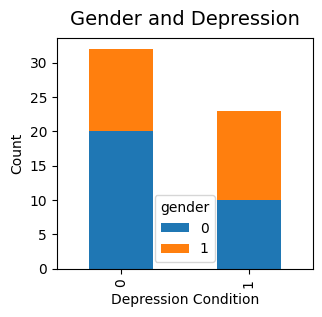

In [45]:
# Gender and Depression Plot
# plt.figure(figsize=(1,1))
valuetable = pd.crosstab(scoredf['depressed'],scoredf['gender']) 
valuetable.plot.bar(stacked=True, figsize=(3.3, 3))
plt.title('Gender and Depression',fontsize=14, y=1.02)
plt.xlabel('Depression Condition')
plt.ylabel('Count')
plt.show()

### Pairplots and Heatmaps <a class="anchor" id="section_5_1"></a>
<p style="text-align: justify;">
A pair plot is a graphical representation of the pairwise relationships between variables in a dataset. It is a matrix of scatter plots and histograms. Pair plots are useful for identifying potential relationships and patterns between variables.
</p>
<p style="text-align: justify;">
Heatmap is a graphical representation of a correlation matrix. A correlation matrix is a table that shows the correlation coefficients between different variables in a dataset. Heatmaps are useful for identifying which variables are highly correlated with each other.
Both pair plots and heatmaps are used in this part of EDA to visualize the relationships between variables and to identify patterns and trends in the data.
</p>

#### Hourly Activity <a class="anchor" id="sub_section_5_1_1"></a>
<p style="text-align: justify;">
The pairplot of the Hourly activity depicts that the correlation between the body activity in sleeping time (12 pm until 7 am) and other times of the day is not strong. Accordingly, by comparing the scatter plots of each hour, we can see that there is a strong correlation between one specific hour and one hour before and after it. But for 6 am and 7 am which are the wake up times, the same pattern does not exist.
</p>

<Figure size 600x500 with 0 Axes>

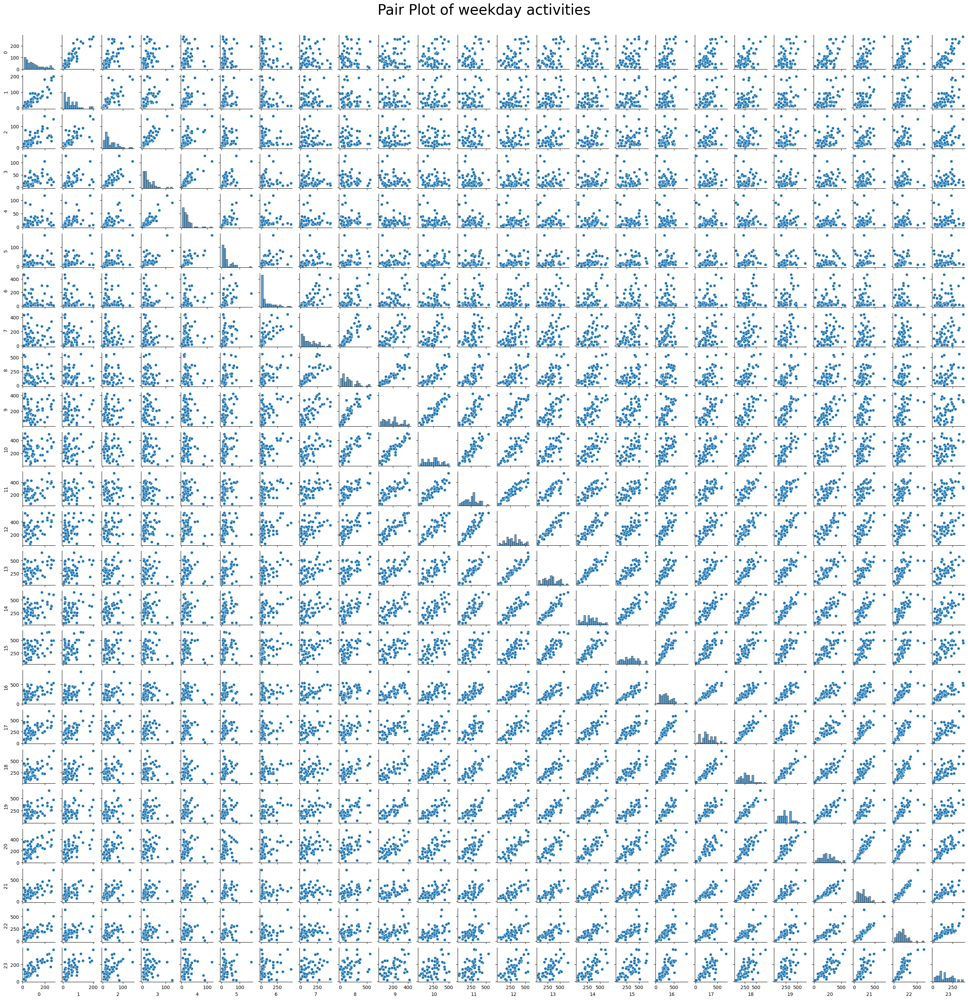

In [46]:
# Pairplot of Hourly Activity
plt.figure(figsize=(6,5))
p = sns.pairplot(hourly_model.iloc[:,3:], height=1.2, aspect=1, diag_kws={"bins": 15, "alpha": 0.7, "edgecolor": "k"});
p.fig.suptitle("Pair Plot of weekday activities",fontsize=30, y=1.02);
plt.show()

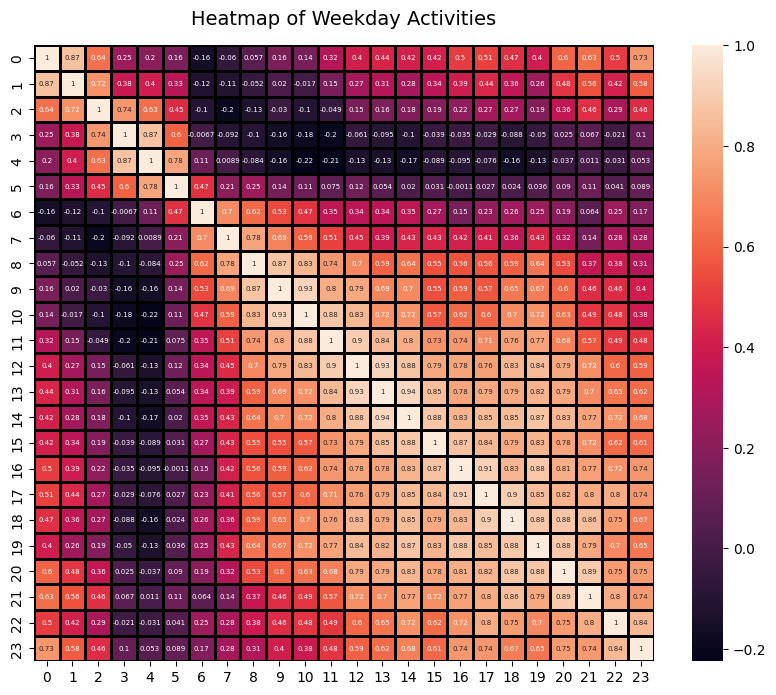

In [47]:
# heatmap of Hourly Activity
plt.figure(figsize=(10,8))
sns.heatmap(hourly_model.iloc[:,3:].corr(), annot=True, annot_kws={"size": 5}, linewidth=1, linecolor="black")
plt.title('Heatmap of Weekday Activities',fontsize=14, y=1.02)
plt.show()

#### Interval Activity <a class="anchor" id="sub_section_5_1_2"></a>
<p style="text-align: justify;">
The pairplot of the interval activity shows the same pattern as hourly activities. The linear correalation between the activitis between 12 pm until 6 am (sleeping time) and the activities of other time intervals is not strong (les than 0.45).
reagrding the heatmap of weekday activity, the correlation coefficient between the weekdays is at least 0.7.
</p>

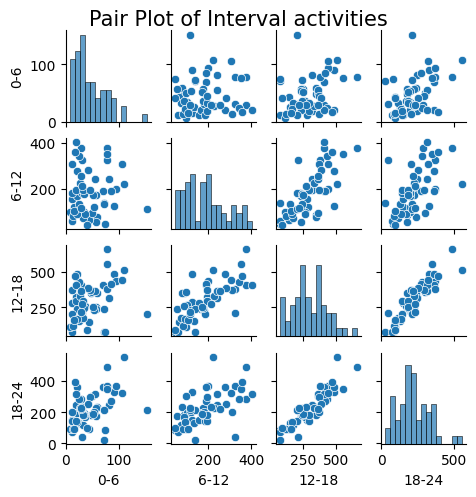

In [48]:
# Pairplot of Weekday Activity
p = sns.pairplot(interval_model.iloc[:,3:], height=1.2, aspect=1, diag_kws={"bins": 15, "alpha": 0.7, "edgecolor": "k"});
p.fig.suptitle("Pair Plot of Interval activities",fontsize=15, y=1.02);
plt.show()

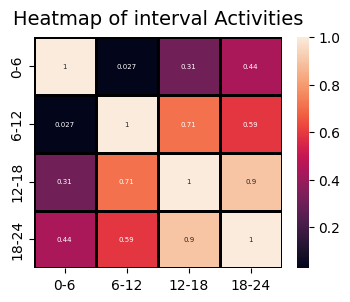

In [49]:
# heatmap of Weekday Activity
plt.figure(figsize=(4,3))
sns.heatmap(interval_model.iloc[:,3:].corr(), annot=True, annot_kws={"size": 5}, linewidth=1, linecolor="black")
plt.title('Heatmap of interval Activities',fontsize=14, y=1.02)
plt.show()

#### Weekday Activity <a class="anchor" id="sub_section_5_1_3"></a>
<p style="text-align: justify;">
The pairplot of the weekday activity shows that there is a linear correalation between the activity for each day.
Regrding the heatmap the weekday activities are highly correlated (with the correlation coefficient between of least 0.7).
</p>

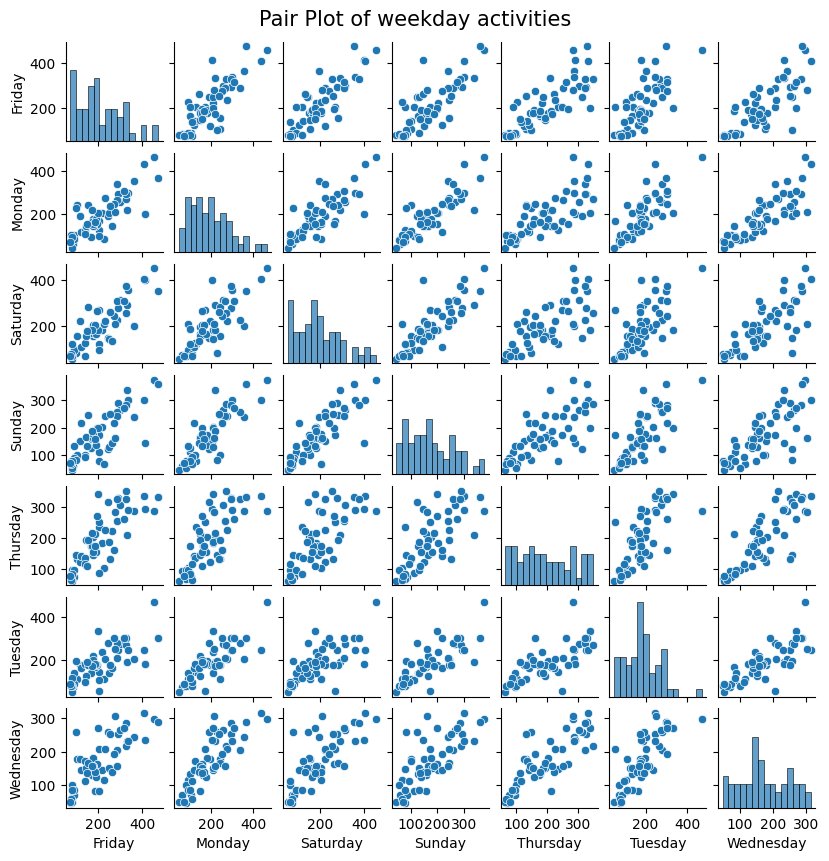

In [50]:
# Pairplot of Weekday Activity
p = sns.pairplot(weekday_model.iloc[:,3:], height=1.2, aspect=1, diag_kws={"bins": 15, "alpha": 0.7, "edgecolor": "k"});
p.fig.suptitle("Pair Plot of weekday activities",fontsize=15, y=1.02);
plt.show()

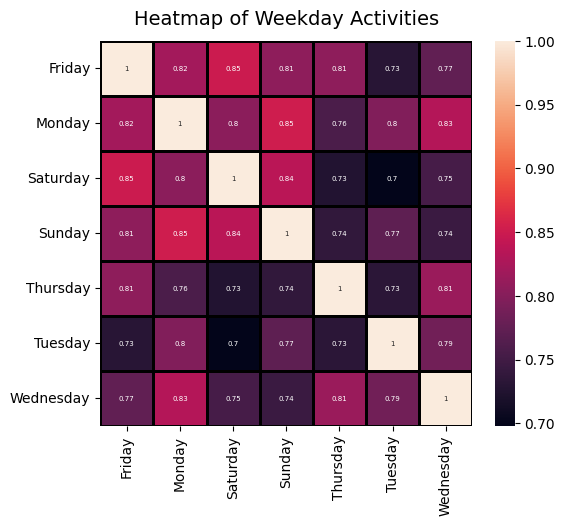

In [51]:
# heatmap of Weekday Activity
plt.figure(figsize=(6,5))
sns.heatmap(weekday_model.iloc[:,3:].corr(), annot=True, annot_kws={"size": 5}, linewidth=1, linecolor="black")
plt.title('Heatmap of Weekday Activities',fontsize=14, y=1.02)
plt.show()

### Plots for each timeseries <a class="anchor" id="section_5_2"></a>
<p style="text-align: justify;">
In the following, we created 6 plots for each datasets. We used compare_plot() that creates a figure with 6 subplots to compare different visualizations of a given time series dataset.
</p>

* The first subplot is a line plot on the original raw data. It depicts the periodic pattern but also some noises in each dataset.
* The second subplot is a line plot on the smoothed data using a moving average with a window size of 60 minutes. The smoothed data is less noisy and easier to interpret, revealing more clear patterns over time.
* The third subplot is the line plot on the fast fourier transformed data. Here we have frequency domain instead of time domain.
* The fourth subplot shows a histogram of the raw data using a specified number of bins. All of the histograms appear to be right skewed, with a few outliers towards the higher end.
* The fifth subplot shows a line plot of the average activity levels per weekday. There is not a clear pattern in the weekday activities of the individuals comparing to eachother. 
* The sixth subplot shows the average activity levels per hour, aggregated over hourly intervals. It appears to be a clear pattern of higher activity levels during the daytime hours (roughly 8am to 8pm), with lower activity levels during the nighttime hours (8 pm to 8 am).This plot depicts almost the same trend for all the individuals. This makes sense, as most people are more active during the day than at night. 


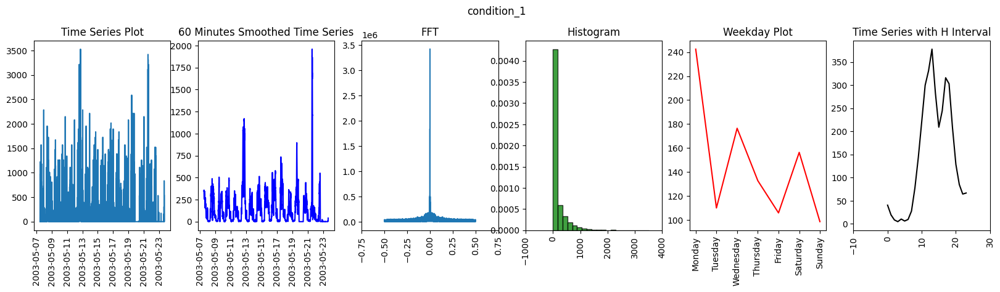

<Figure size 640x480 with 0 Axes>

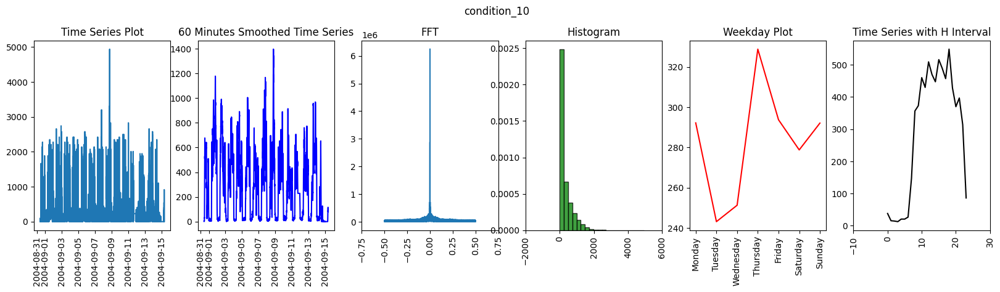

<Figure size 640x480 with 0 Axes>

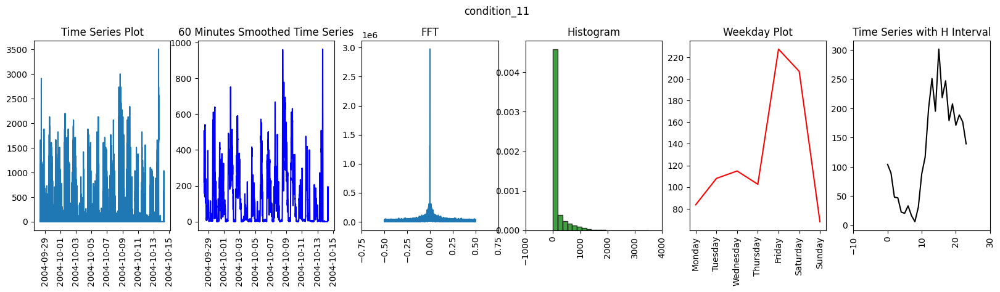

<Figure size 640x480 with 0 Axes>

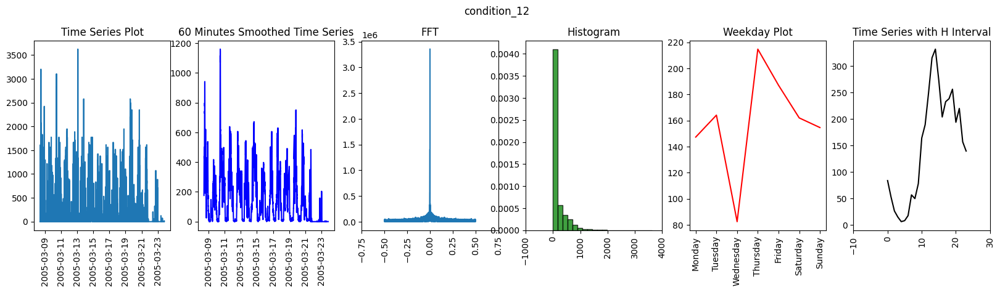

<Figure size 640x480 with 0 Axes>

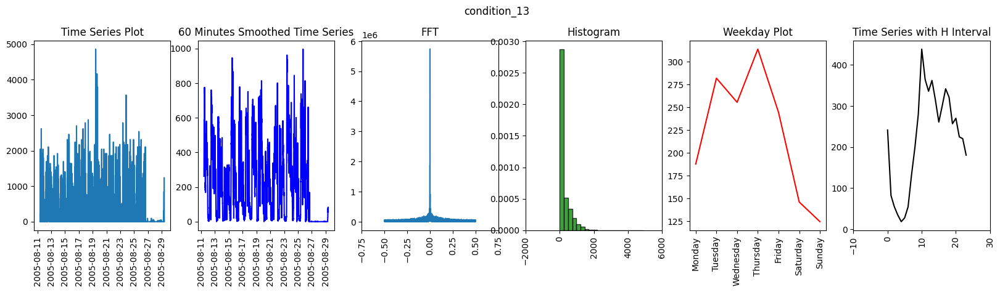

<Figure size 640x480 with 0 Axes>

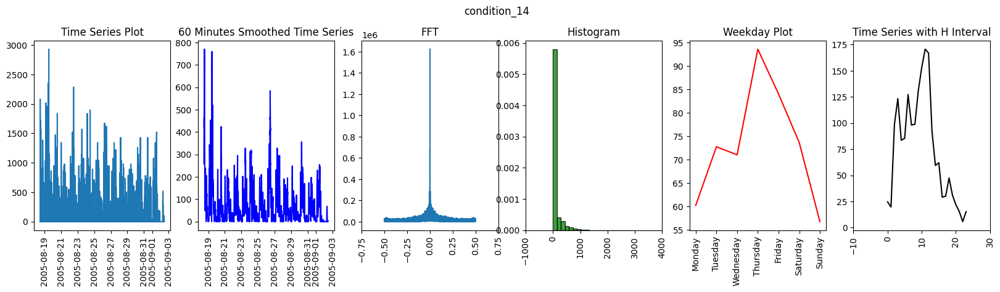

<Figure size 640x480 with 0 Axes>

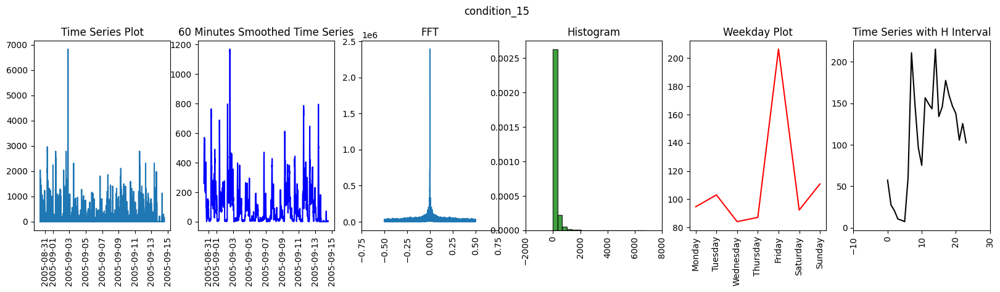

<Figure size 640x480 with 0 Axes>

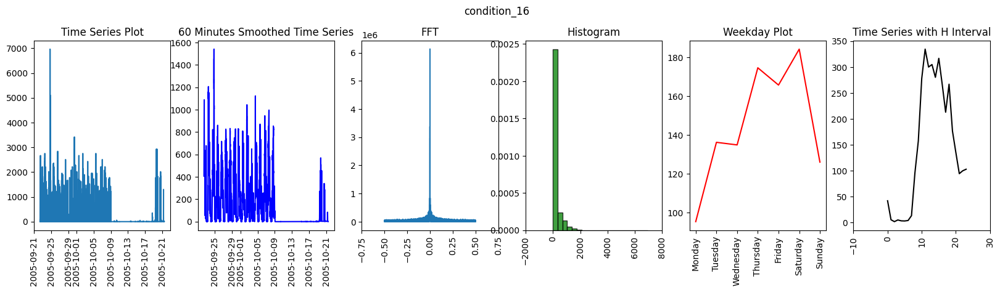

<Figure size 640x480 with 0 Axes>

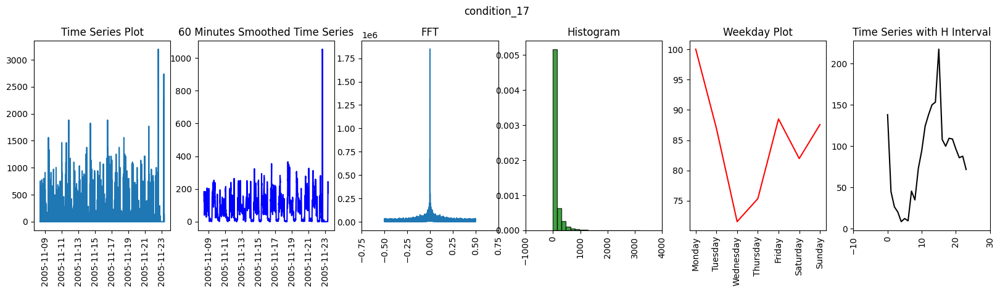

<Figure size 640x480 with 0 Axes>

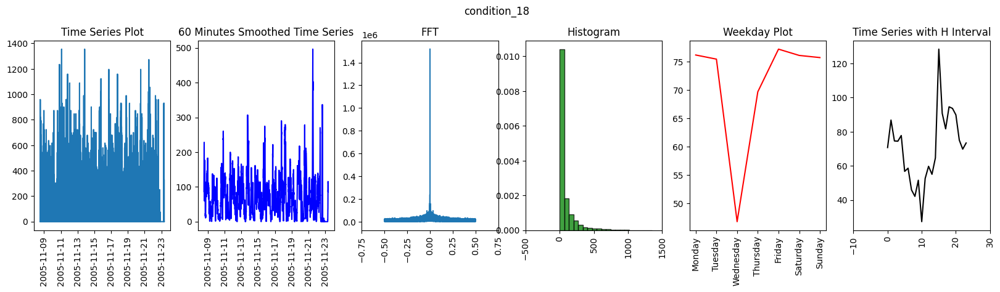

<Figure size 640x480 with 0 Axes>

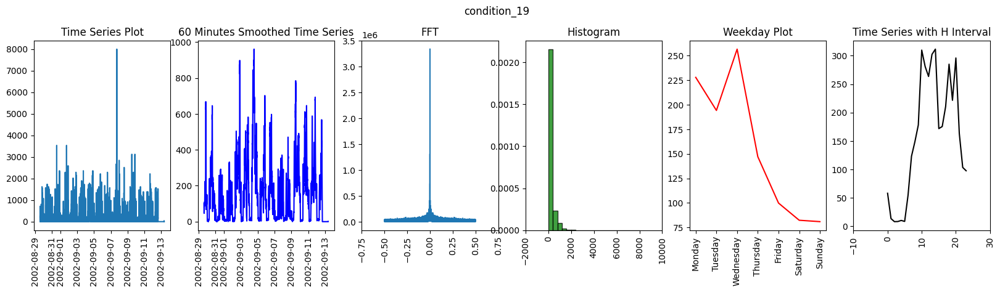

<Figure size 640x480 with 0 Axes>

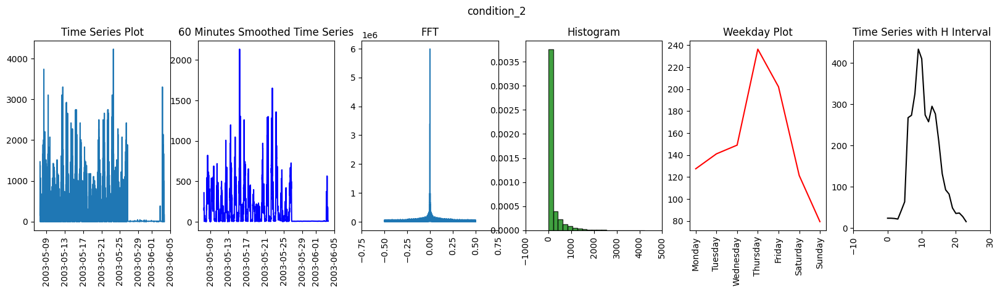

<Figure size 640x480 with 0 Axes>

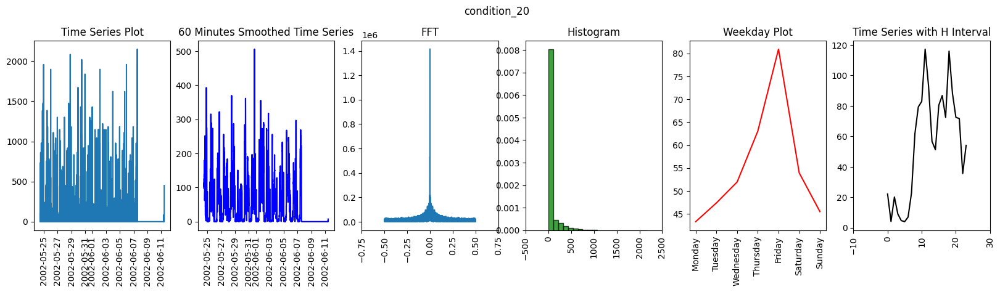

<Figure size 640x480 with 0 Axes>

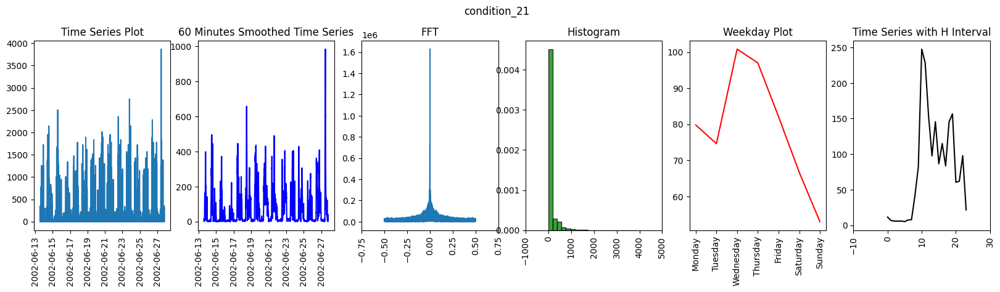

<Figure size 640x480 with 0 Axes>

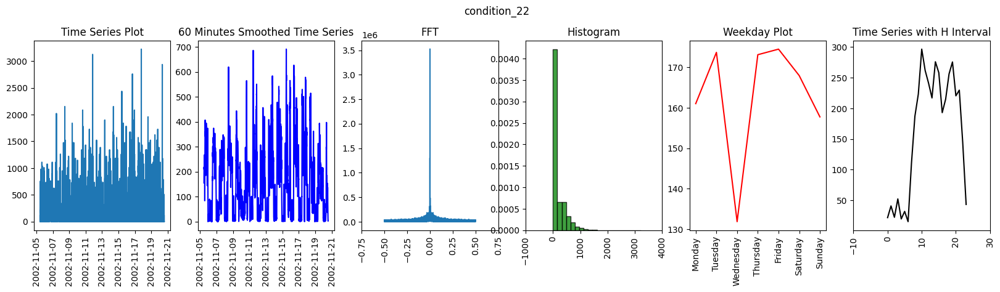

<Figure size 640x480 with 0 Axes>

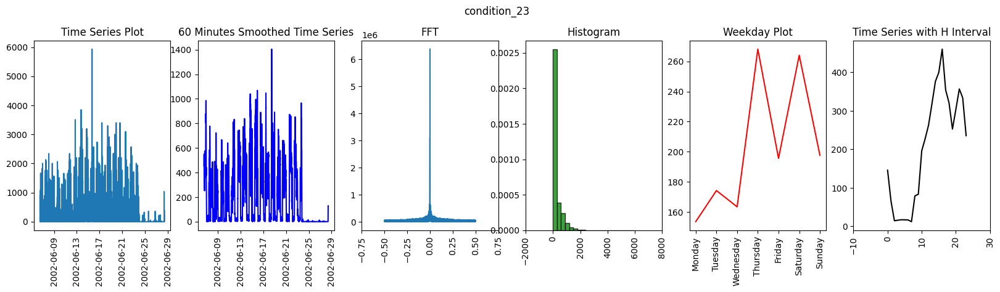

<Figure size 640x480 with 0 Axes>

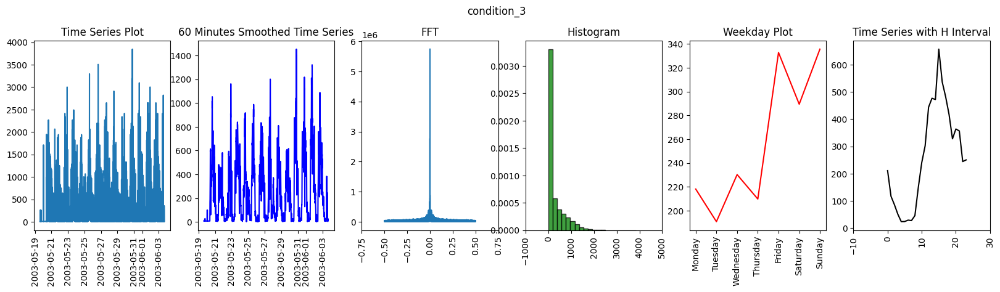

<Figure size 640x480 with 0 Axes>

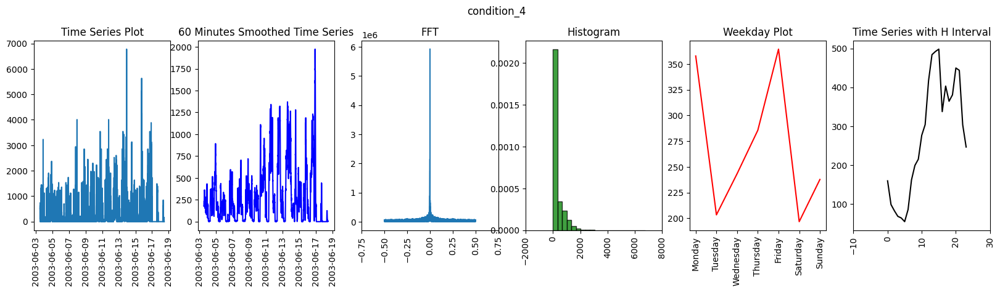

<Figure size 640x480 with 0 Axes>

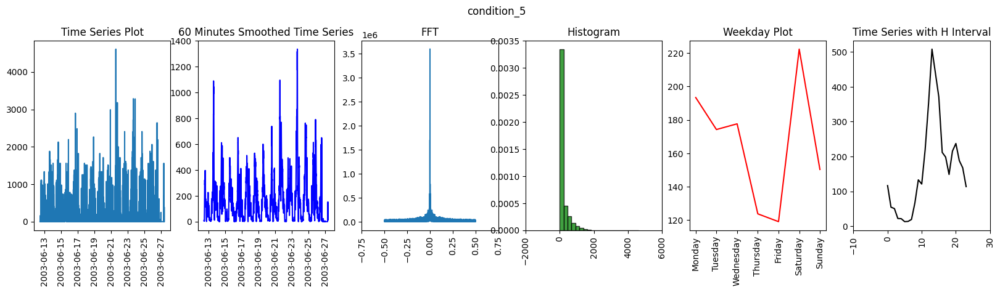

<Figure size 640x480 with 0 Axes>

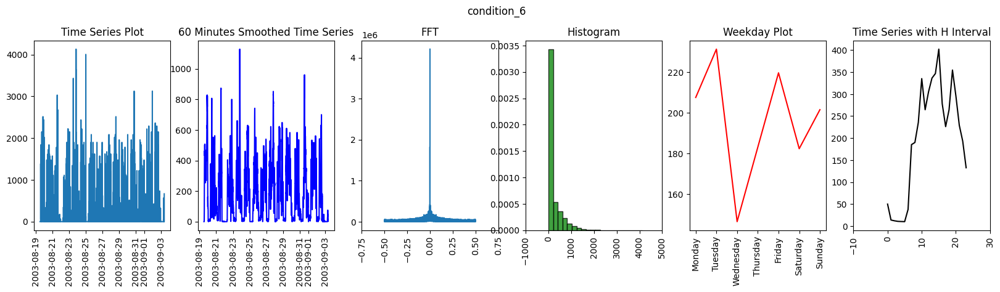

<Figure size 640x480 with 0 Axes>

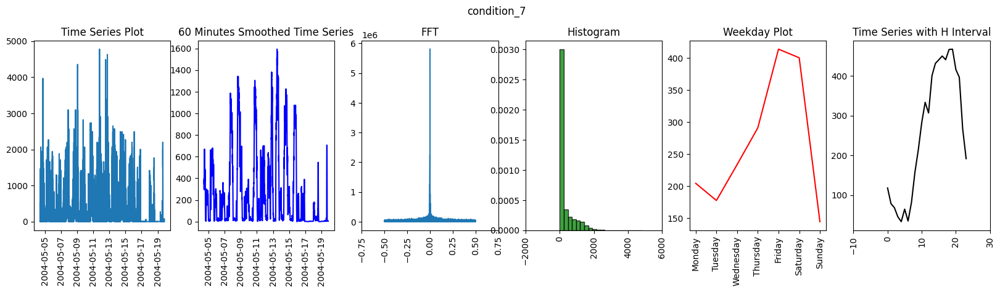

<Figure size 640x480 with 0 Axes>

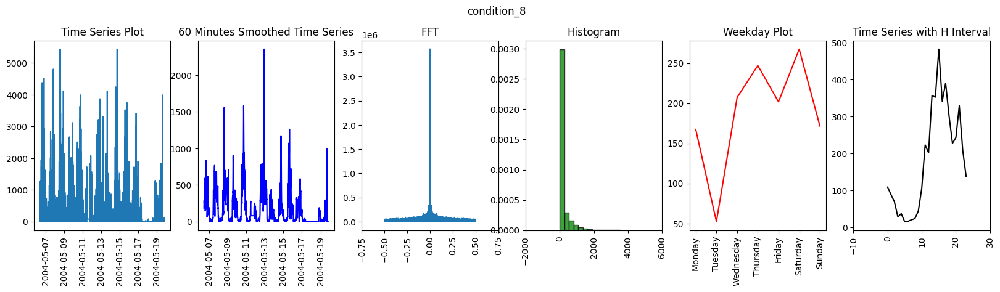

<Figure size 640x480 with 0 Axes>

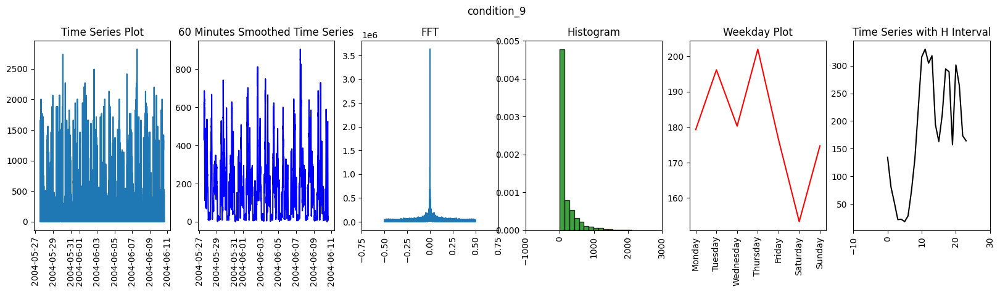

<Figure size 640x480 with 0 Axes>

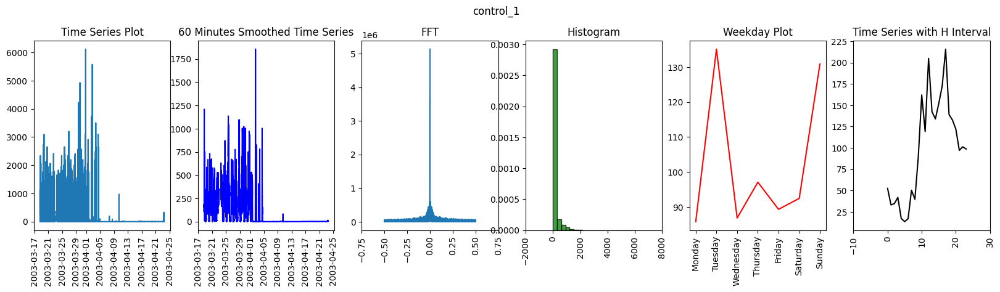

<Figure size 640x480 with 0 Axes>

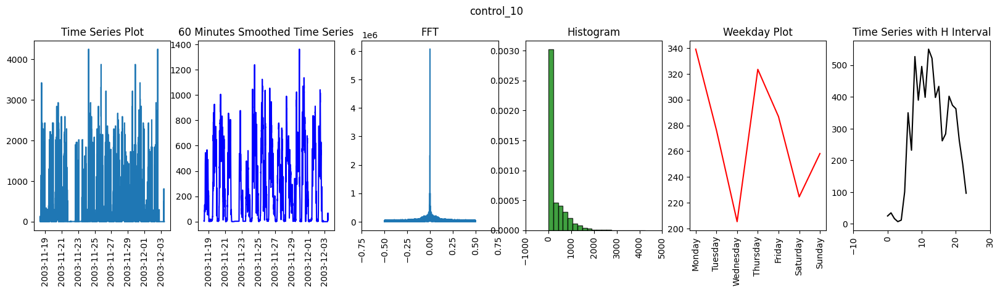

<Figure size 640x480 with 0 Axes>

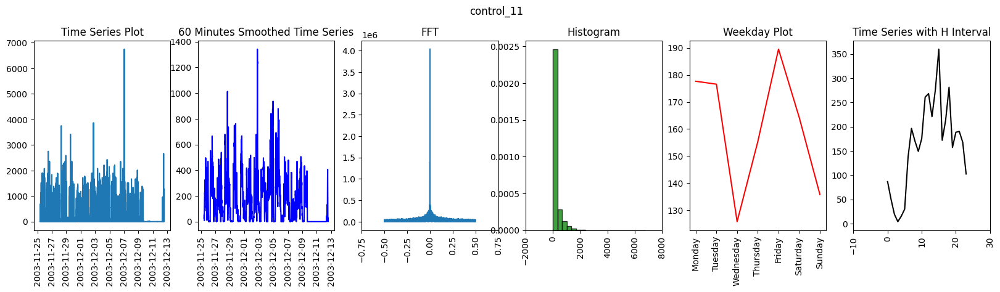

<Figure size 640x480 with 0 Axes>

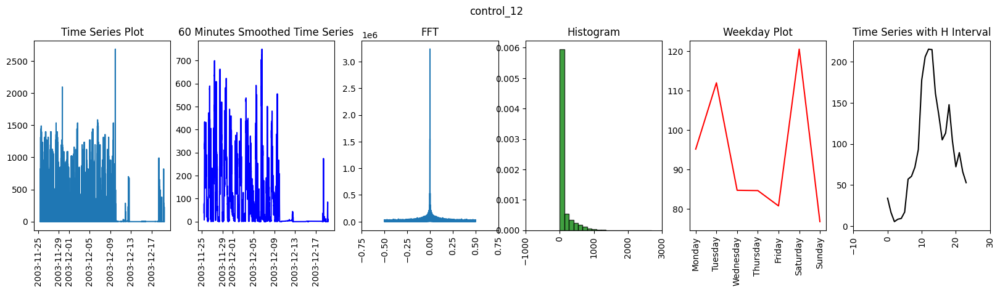

<Figure size 640x480 with 0 Axes>

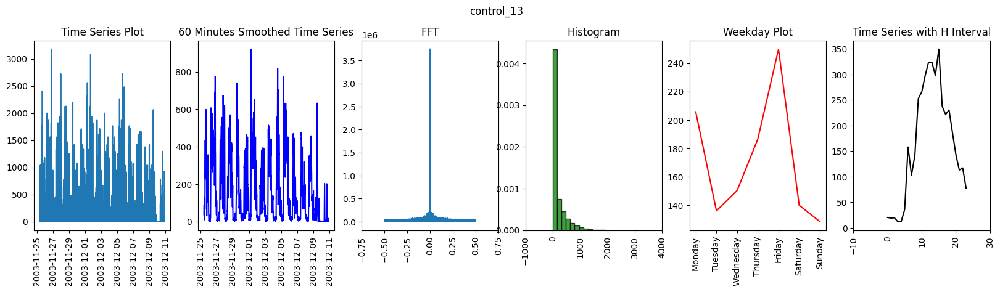

<Figure size 640x480 with 0 Axes>

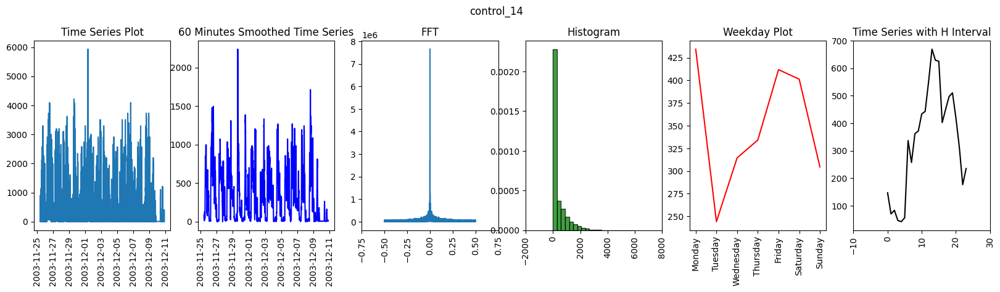

<Figure size 640x480 with 0 Axes>

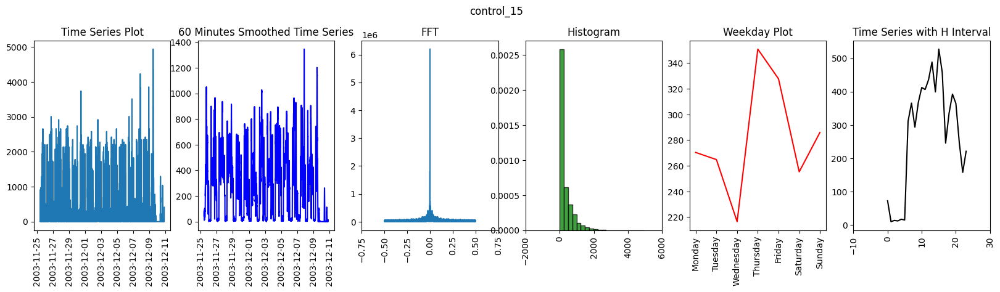

<Figure size 640x480 with 0 Axes>

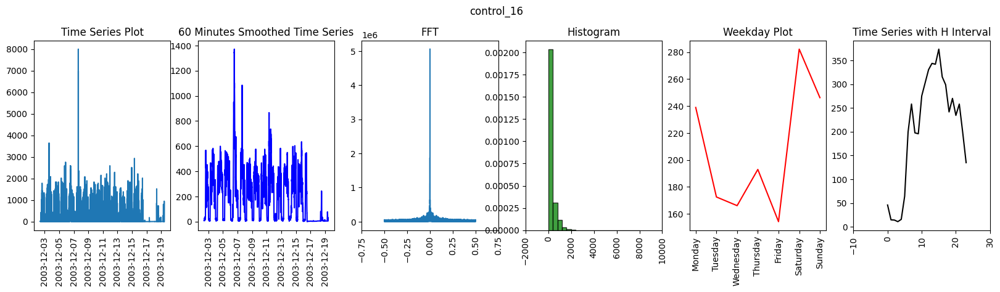

<Figure size 640x480 with 0 Axes>

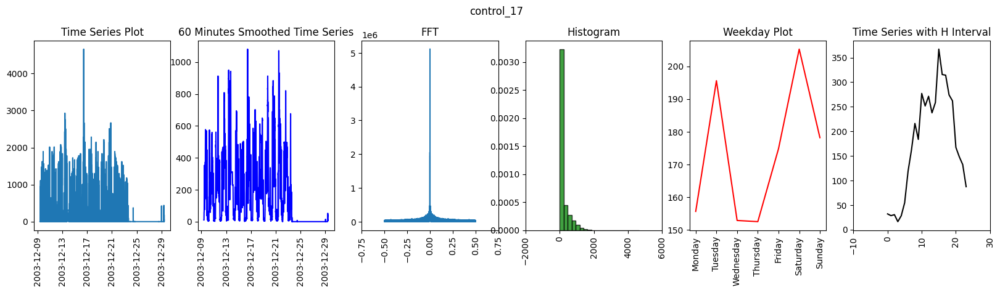

<Figure size 640x480 with 0 Axes>

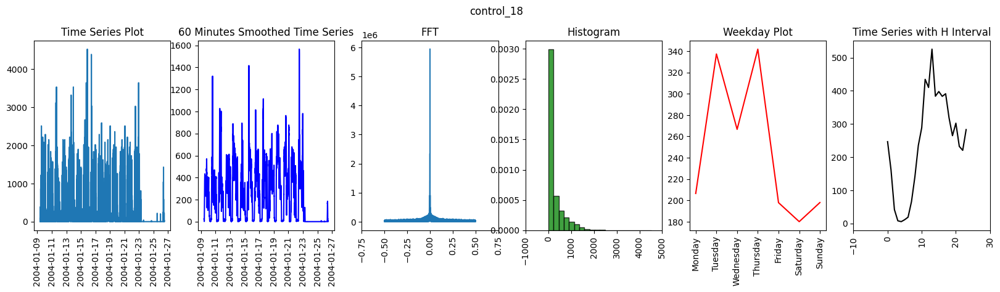

<Figure size 640x480 with 0 Axes>

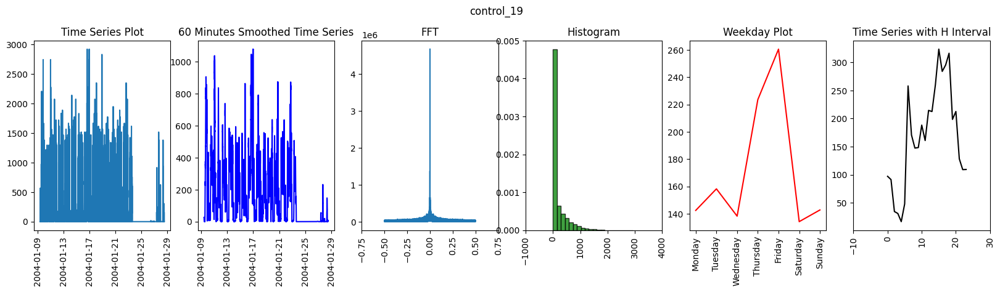

<Figure size 640x480 with 0 Axes>

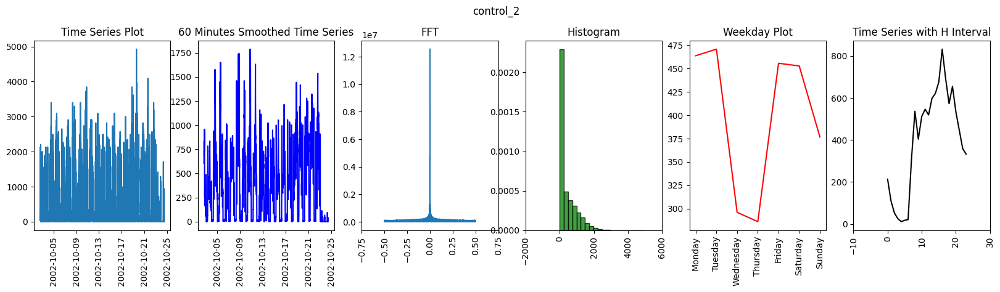

<Figure size 640x480 with 0 Axes>

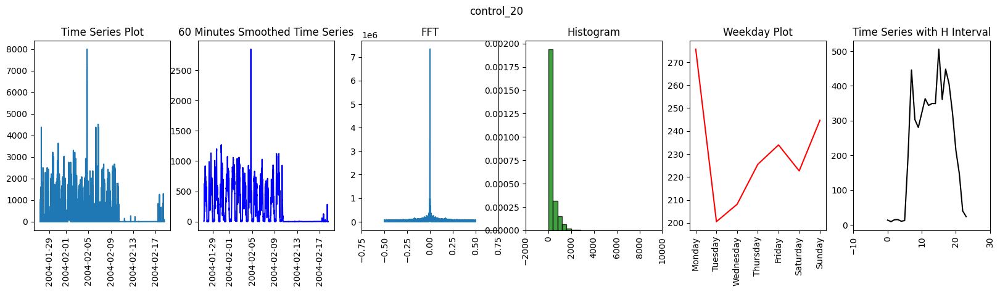

<Figure size 640x480 with 0 Axes>

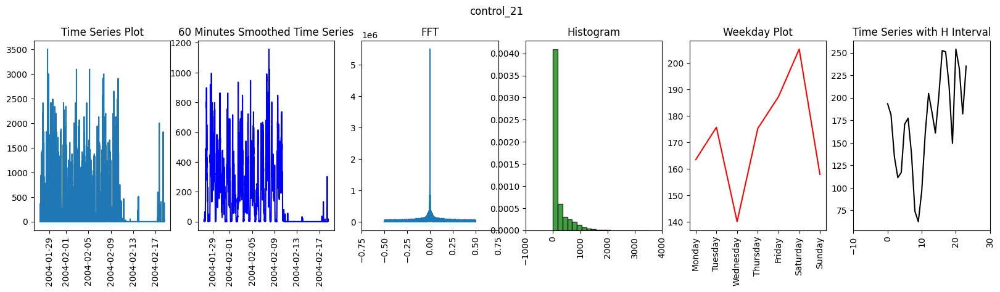

<Figure size 640x480 with 0 Axes>

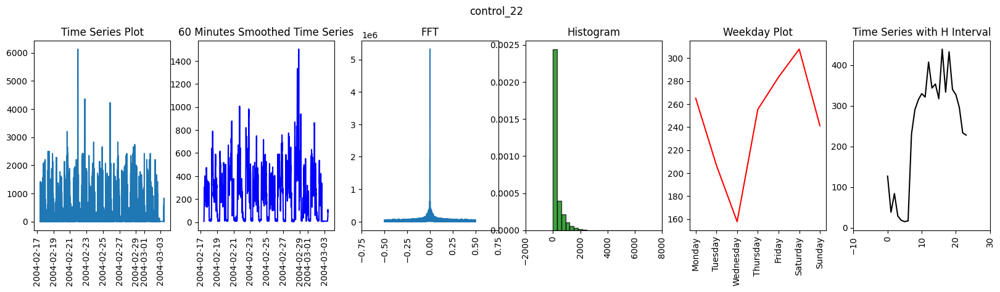

<Figure size 640x480 with 0 Axes>

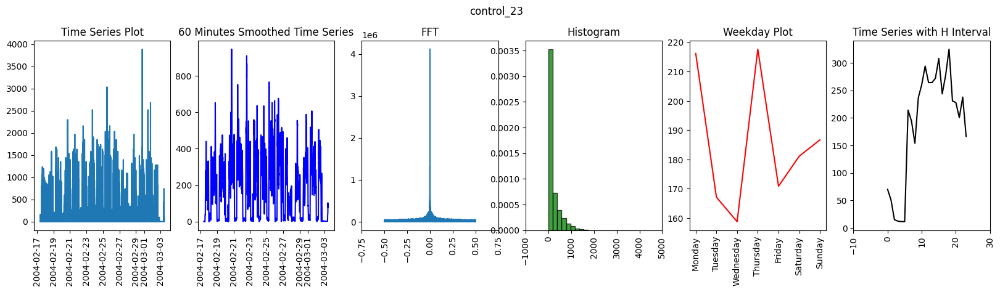

<Figure size 640x480 with 0 Axes>

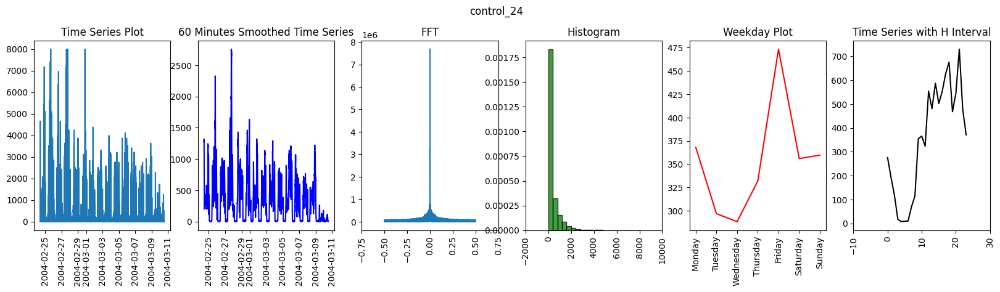

<Figure size 640x480 with 0 Axes>

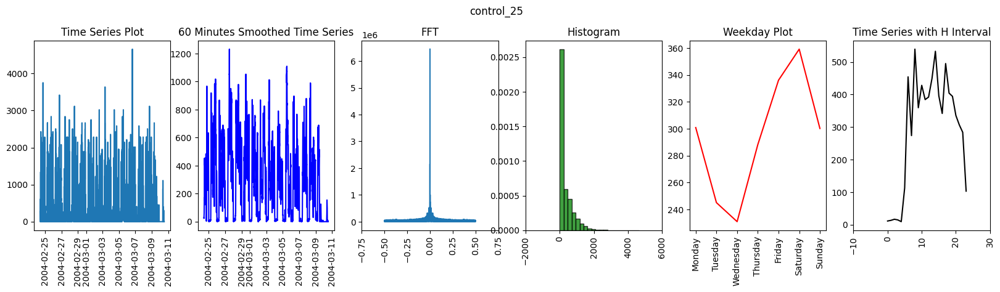

<Figure size 640x480 with 0 Axes>

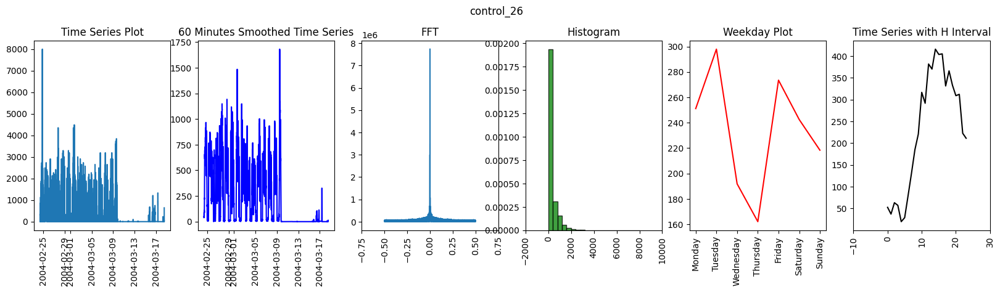

<Figure size 640x480 with 0 Axes>

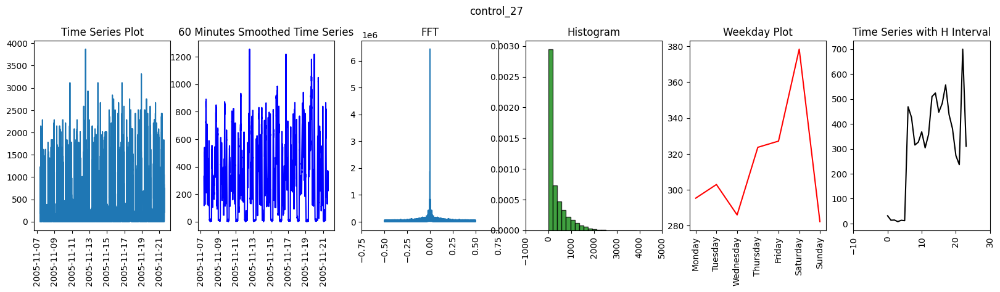

<Figure size 640x480 with 0 Axes>

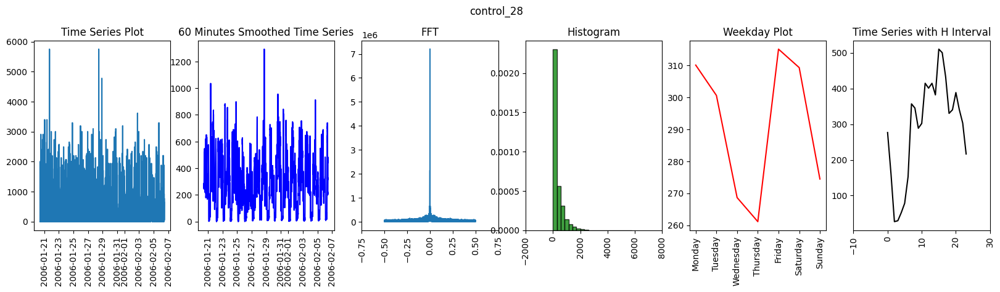

<Figure size 640x480 with 0 Axes>

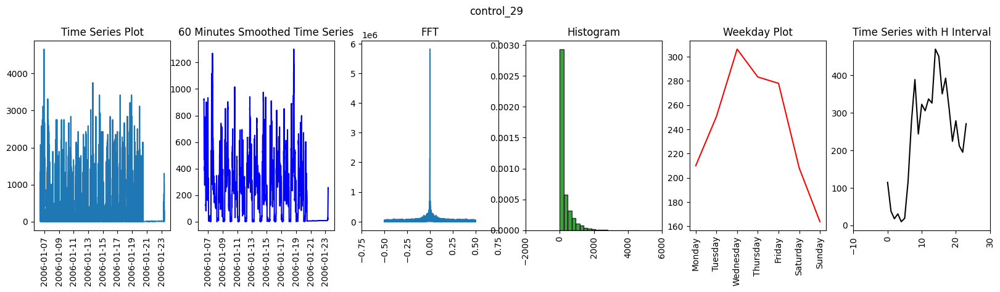

<Figure size 640x480 with 0 Axes>

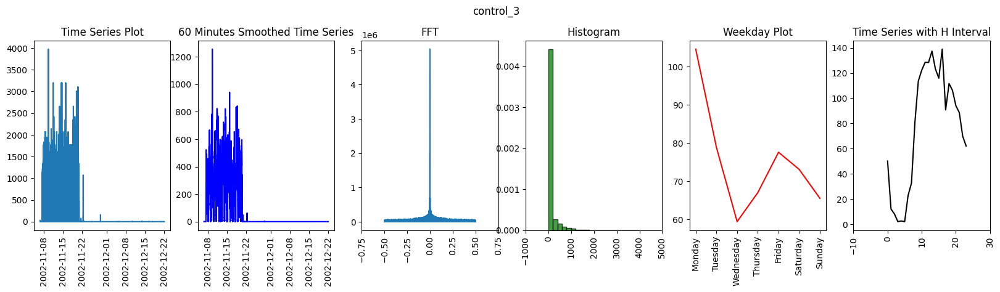

<Figure size 640x480 with 0 Axes>

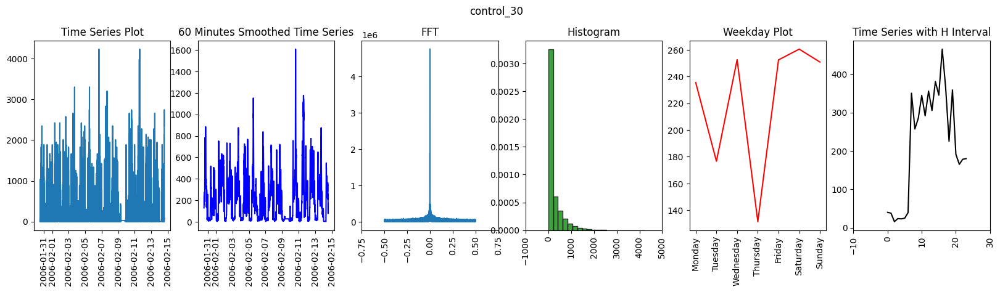

<Figure size 640x480 with 0 Axes>

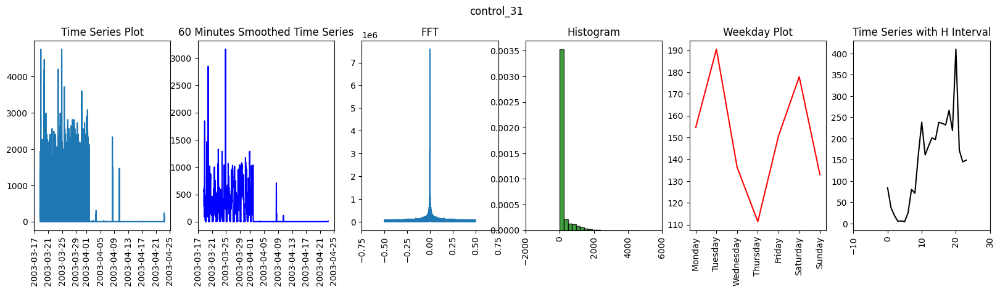

<Figure size 640x480 with 0 Axes>

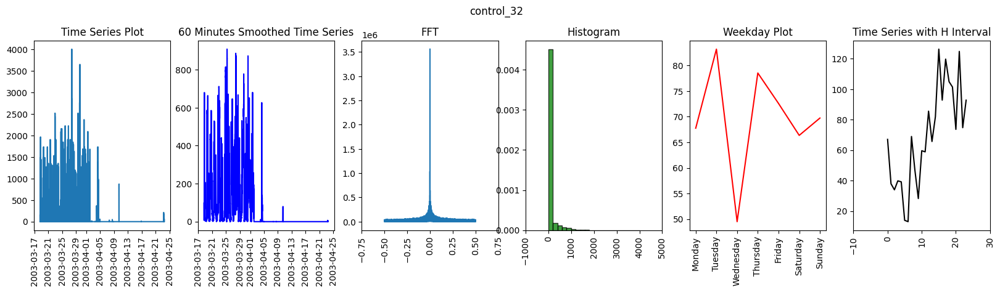

<Figure size 640x480 with 0 Axes>

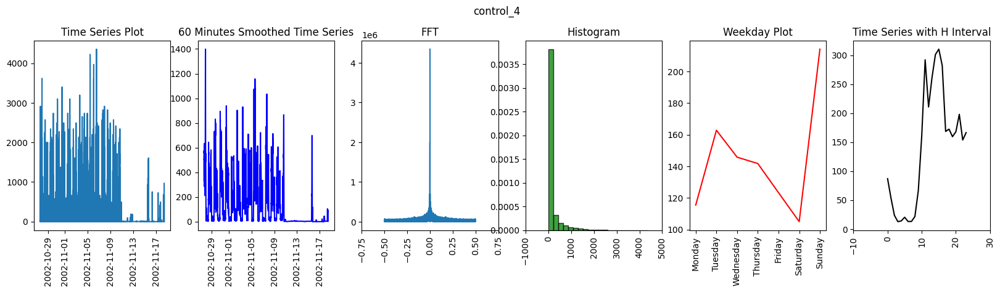

<Figure size 640x480 with 0 Axes>

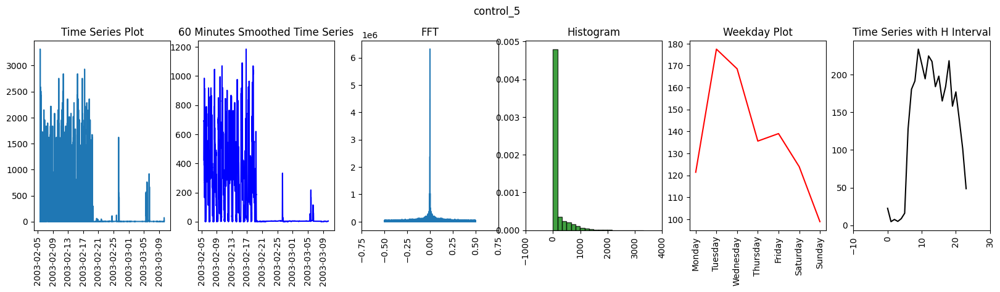

<Figure size 640x480 with 0 Axes>

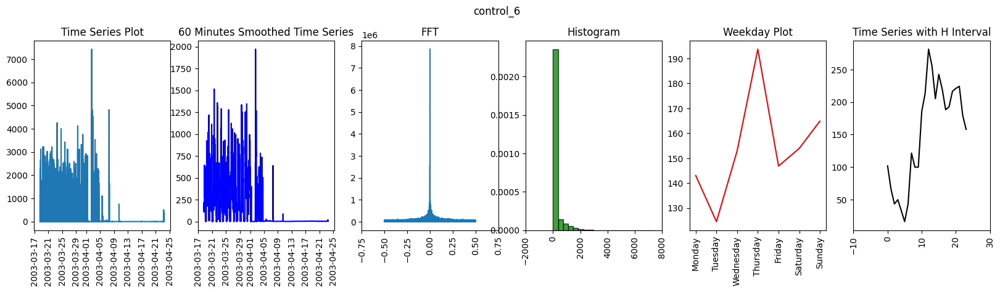

<Figure size 640x480 with 0 Axes>

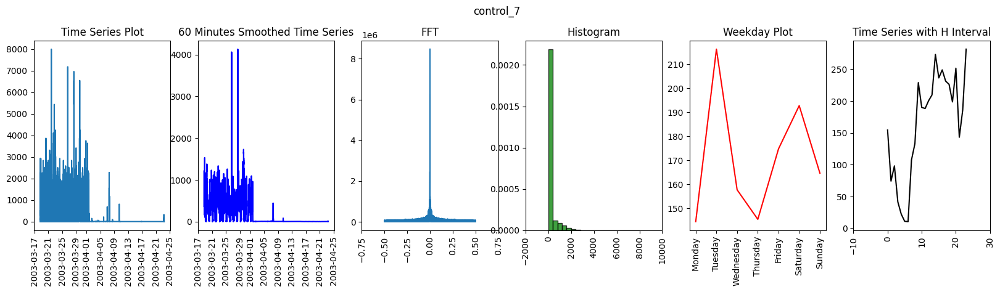

<Figure size 640x480 with 0 Axes>

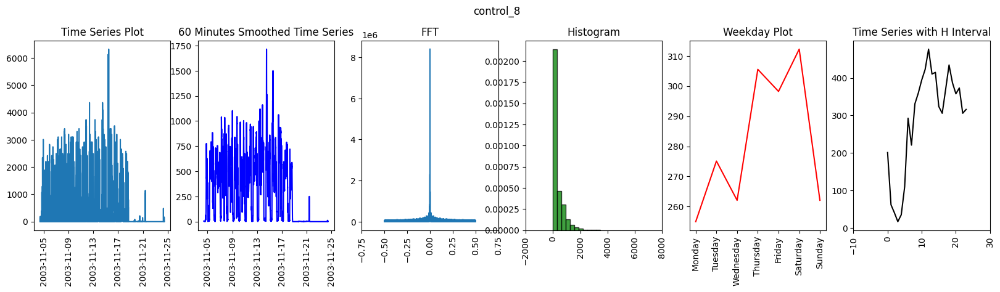

<Figure size 640x480 with 0 Axes>

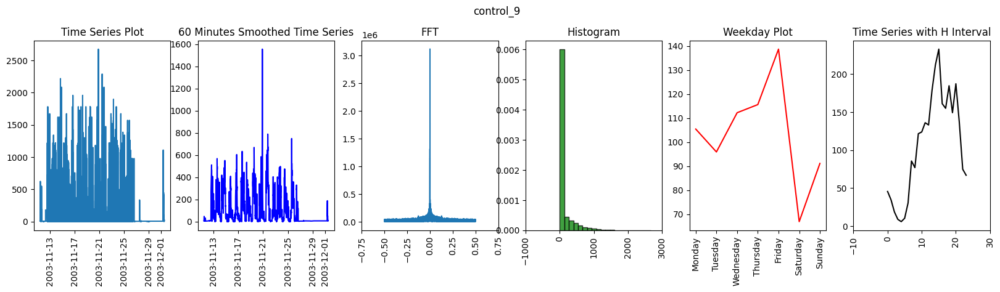

<Figure size 640x480 with 0 Axes>

In [52]:
#| fold: True
# We use the function we created before to plot each of our csv files in condition and control dataset.
for i,name in enumerate(list(filled_dfs.keys())):
    df = filled_dfs[list(filled_dfs.keys())[i]]
    compare_plot(df, window=60, interval='H', title=name)
    plt.suptitle(i)  
    plt.show()

### Comparision between Condition and Control group <a class="anchor" id="section_5_3"></a>
<p style="text-align: justify;">
In order to see the differences between the two groups of condition and control, We compared the activity variable in hourly, interval and the weekday basis. To do so, we create a new aggregated dataset which contains hourly average of activities with a week day and time label for each of them.
</p>

#### Heatmaps <a class="anchor" id="sub_section_5_3_1"></a>
In order to better understand the data, we use heatmap to visualize the differences between two groups.

<p style="text-align: justify;">
The <b>Hourly Activity Heatmap</b> heatmap compares the average of hourly activities of groups. The plot depicts that the average of activity starts to increase at 6 am for control group and at 8 am for condition group. Generaly, the activity amount in control group is higher than condition group.
</p>

In [53]:
# In this chunk of code, We read all the files in condition and control folders
dfnames = {}
all = []
for i,name in enumerate(list(filled_dfs.keys())):
    df = filled_dfs[list(filled_dfs.keys())[i]]
    df = smoothed_series(df,15)
    df = reduced_series(df,interval='H')
    df.insert(0, 'number', name)
    dfnames[name] = df
    all.append(df)


In [54]:
# Creating a csv file by concatenating all the csv files and Adding 2 colunms to our aggregated dataset
agg_csv = pd.concat(all, ignore_index=True)
agg_csv['weekday'] = agg_csv['timestamp'].dt.day_name()
agg_csv['depressed'] = pd.to_numeric(np.where((agg_csv['number'].str.contains('control')) ,'0',
                    np.where((agg_csv['number'].str.contains('condition')),'1',agg_csv['number'])))

In [55]:
#| include: False
agg_csv.head()

,number,timestamp,activity,time,weekday,depressed
0,condition_1,2003-05-07 12:00:00,364.257971,12,Wednesday,1
1,condition_1,2003-05-07 13:00:00,297.191111,13,Wednesday,1
2,condition_1,2003-05-07 14:00:00,276.710000,14,Wednesday,1
3,condition_1,2003-05-07 15:00:00,243.820000,15,Wednesday,1
4,condition_1,2003-05-07 16:00:00,223.770000,16,Wednesday,1


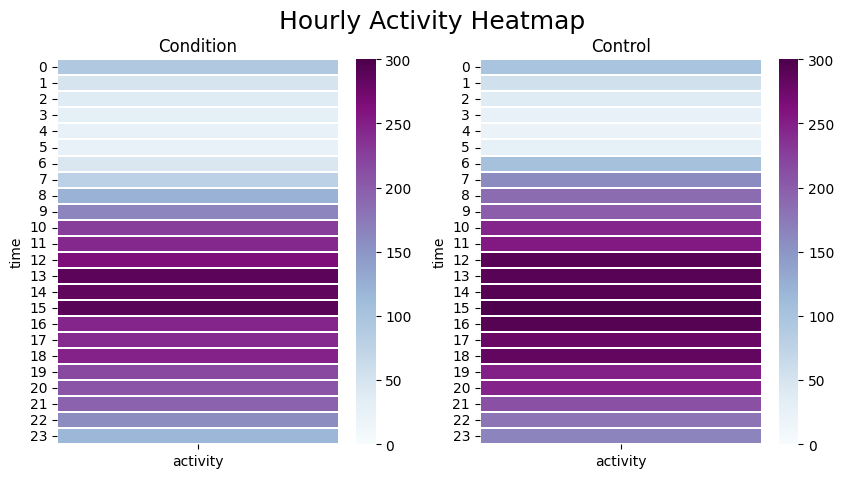

In [56]:
# plotting the heatmap for Hourly Activity
fig, axs = plt.subplots(ncols=2, figsize=(10, 5))

heatmap_condition = (agg_csv.loc[agg_csv['depressed']==1]).groupby(['time'])['activity'].mean()
heatmap_condition = heatmap_condition.to_frame()
sns.heatmap(heatmap_condition, linewidth=0.01, linecolor= 'white', cmap='BuPu', ax=axs[0],vmin=0, vmax=300)
axs[0].set_title('Condition')

heatmap_control = (agg_csv.loc[agg_csv['depressed']==0]).groupby(['time'])['activity'].mean()
heatmap_control = heatmap_control.to_frame()
sns.heatmap(heatmap_control, linewidth=0.01, linecolor= 'white', cmap= 'BuPu', ax=axs[1],vmin=0, vmax=300)
axs[1].set_title('Control')

plt.suptitle('Hourly Activity Heatmap',fontsize=18)
plt.show()

<p style="text-align: justify;">
The <b>Weekday Activity Heatmap</b> compares the average of weekday activities of groups. The plot shows that except Mondays and Fridays, the average of activity amount for each weekday in condition group is less than control group.
</p>

Text(0.5, 0.98, 'Weekday Activity Heatmap')

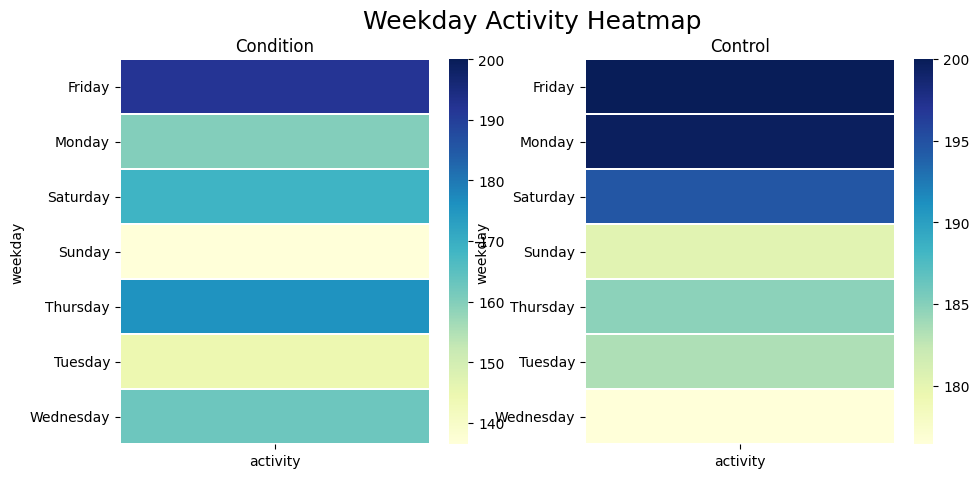

In [57]:
fig, axs = plt.subplots(ncols=2, figsize=(11, 5))

weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

heatmap_condition = (agg_csv.loc[agg_csv['depressed']==1]).groupby(['weekday'])['activity'].mean()
heatmap_condition = heatmap_condition.to_frame()
# sns.heatmap(heatmap_condition, linewidth=0.01, linecolor= 'white', cmap='YlGnBu', ax= axs[0], yticklabels= weekday_order,vmin=100, vmax=200)
sns.heatmap(heatmap_condition, linewidth=0.01, linecolor= 'white', cmap='YlGnBu', ax= axs[0],vmax=200)

axs[0].set_title('Condition')

heatmap_control = (agg_csv.loc[agg_csv['depressed']==0]).groupby(['weekday'])['activity'].mean()
heatmap_control = heatmap_control.to_frame()
# sns.heatmap(heatmap_control, linewidth=0.01, linecolor= 'white', cmap= 'YlGnBu', ax= axs[1], yticklabels= weekday_order,vmin=100, vmax=200)
sns.heatmap(heatmap_control, linewidth=0.01, linecolor= 'white', cmap= 'YlGnBu', ax= axs[1],vmax=200)

axs[1].set_title('Control')

plt.suptitle('Weekday Activity Heatmap',fontsize=18)


<p style="text-align: justify;">
In the <b>Weekday and Daytime Activity Heatmap</b> compares the activity for each weekday and day time in control and condition groups. Still we can observed that amount of activity in control group is usually higher that condition group in all weekdays.
The heatmap for the "Condition" group appears to show lower levels of activity during weekdays and higher levels during the weekend (Saturday and Sunday). There is a noticeable dip in activity during weekday afternoons (12:00 to 16:00).
We can observe that for Condition group, people generally have very less activities on tuesdays and Sundays.
Whereas in Control group, we observe increase in activity during the weekends, specially Saturday between 11:00 to 17:00 hours. Activities also looks higher on mondays between the afternoon hours.
However for Control group Friday looks like hoghest in activity during 13:00 to 18:00 hours.
</p>

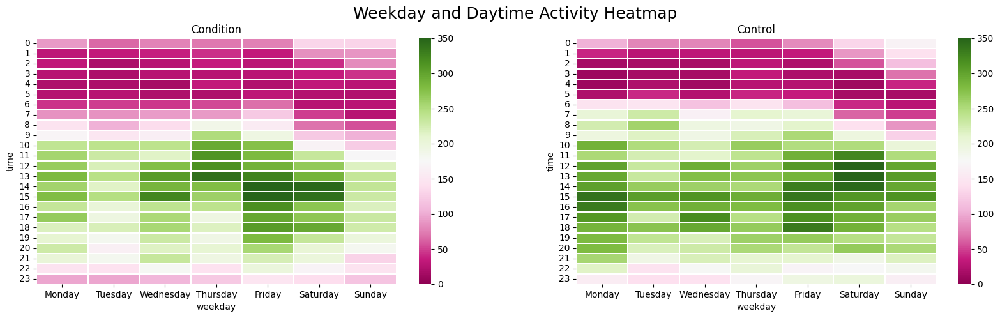

In [58]:
# plotting the heatmap for Hourly Activity per each weekday
#| code-fold: False
#| label:fig-anyname
#| fig-cap: "plots for each individual"
#| include: True
fig, axs = plt.subplots(ncols=2, figsize=(20, 5))
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

heatmap_condition = (agg_csv.loc[agg_csv['depressed']==1]).groupby(['weekday','time'])['activity'].mean()
heatmap_condition = heatmap_condition.reset_index()
heatmap_condition['weekday'] = pd.Categorical(heatmap_condition['weekday'], categories=weekday_order, ordered=True)
sns.heatmap(heatmap_condition.pivot_table(index='time', columns='weekday', values='activity'), linewidth=0.01, linecolor="white", cmap='PiYG', ax=axs[0],vmin=0, vmax=350)
axs[0].set_title('Condition')

heatmap_control = (agg_csv.loc[agg_csv['depressed']==0]).groupby(['weekday','time'])['activity'].mean()
heatmap_control = heatmap_control.reset_index()
heatmap_control['weekday'] = pd.Categorical(heatmap_control['weekday'], categories=weekday_order, ordered=True)
sns.heatmap(heatmap_control.pivot_table(index='time', columns='weekday', values='activity'), linewidth=0.01, linecolor="white", cmap='PiYG', ax=axs[1],vmin=0, vmax=350)
axs[1].set_title('Control')

plt.suptitle('Weekday and Daytime Activity Heatmap',fontsize=18)

plt.show()


#### Lineplots <a class="anchor" id="sub_section_5_3_1"></a>
In the following, we compare the weekday activity and hourly activity in lineplots.

<p style="text-align: justify;">
In <b>Weekday Activity Lineplot</b>, it can be seen that in all weekdays, the amount of activity for control group is more than condition group.
The weekday activity level for condition group has its minimum in Sunday, but the control group has its minimum on Wednesday. The both groups has their most activity level on Friday.
</p>

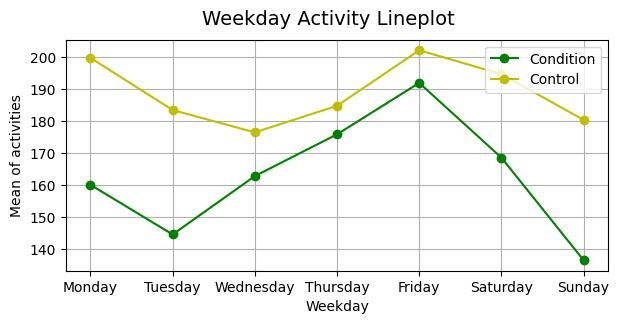

In [59]:
# Comparing the mean of weekday of 24 hours for 2 groups

plt.figure(figsize=(7, 3))

weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

lineplot_condition = (agg_csv.loc[agg_csv['depressed']==1]).groupby(['weekday'])['activity'].mean()
lineplot_condition = lineplot_condition.reset_index()
lineplot_condition['weekday'] = pd.Categorical(lineplot_condition['weekday'], categories=weekday_order, ordered=True)
lineplot_condition = lineplot_condition.sort_values('weekday')

lineplot_control = (agg_csv.loc[agg_csv['depressed']==0]).groupby(['weekday'])['activity'].mean()
lineplot_control = lineplot_control.reset_index()
lineplot_control['weekday'] = pd.Categorical(lineplot_control['weekday'], categories=weekday_order, ordered=True)
lineplot_control = lineplot_control.sort_values('weekday')

plt.plot(lineplot_condition['weekday'], lineplot_condition['activity'], 'g-o', label='Condition')
plt.plot(lineplot_control['weekday'], lineplot_control['activity'], 'y-o', label='Control')

plt.xlabel('Weekday')
plt.ylabel('Mean of activities')
plt.legend(bbox_to_anchor=(1, 1), loc='upper right')
plt.suptitle('Weekday Activity Lineplot', fontsize=14)
plt.grid(True)

plt.show()


<p style="text-align: justify;">
The <b>Hourly Activity Lineplot</b> plot depicts that both control and condition group follow the same trend but overall, the number of activity per hour for control group is more than condition group. 
</p>
<p style="text-align: justify;">
we can see that the mean activity level is generally higher during the daytime (between 7:00 and 20:00 hours) and lower during the nighttime (between 21:00 and 6:00 hours) for both groups. However, the activity levels of the condition group are generally lower than those of the control group throughout the day.
Overall, the line plot clearly shows the differences in mean activity levels between the two groups throughout the day, with the control group showing higher activity levels than the condition group. 
</p>

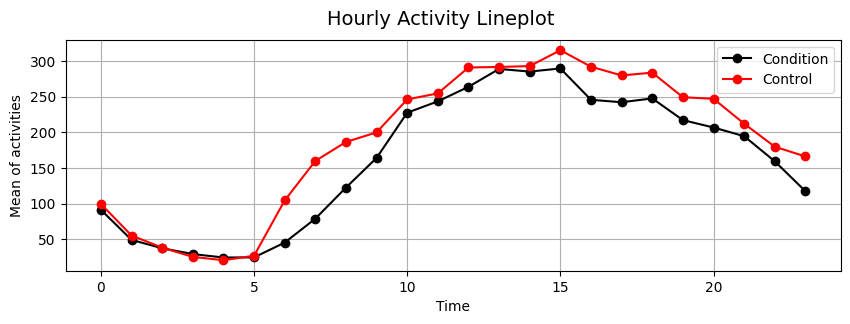

In [60]:
# Comparing the mean of activities of 24 hours for 2 groups

plt.figure(figsize=(10, 3))

lineplot_condition = (agg_csv.loc[agg_csv['depressed']==1]).groupby(['time'])['activity'].mean()
lineplot_condition = lineplot_condition.reset_index()
plt.plot(lineplot_condition['time'],lineplot_condition['activity'], 'k-o',label = 'Condition')

lineplot_control = (agg_csv.loc[agg_csv['depressed']==0]).groupby(['time'])['activity'].mean()
lineplot_control = lineplot_control.reset_index()
plt.plot(lineplot_control['time'],lineplot_control['activity'], 'r-o',label = 'Control')

plt.xlabel('Time')
plt.ylabel('Mean of activities')
plt.legend(bbox_to_anchor=(1, 1), loc='upper right')
plt.suptitle('Hourly Activity Lineplot',fontsize=14)
plt.grid(True)
plt.show()

#### Boxplots <a class="anchor" id="sub_section_5_3_1"></a>
<p style="text-align: justify;">
In the following, we use boxplots for weekday, hourly and interval activity of each groups. Here we can understand the distribution of each feature and detect the outliers. 
Based on the generated boxplots, we understand that both groups have some outliers in the upper range of scores. This suggests that there may be a subset of individuals in both groups who experience occasional very high scores.
Overall, the boxplot suggests that while there may be some differences in the distribution of data between the groups, both appear to have similar patterns.
</p>

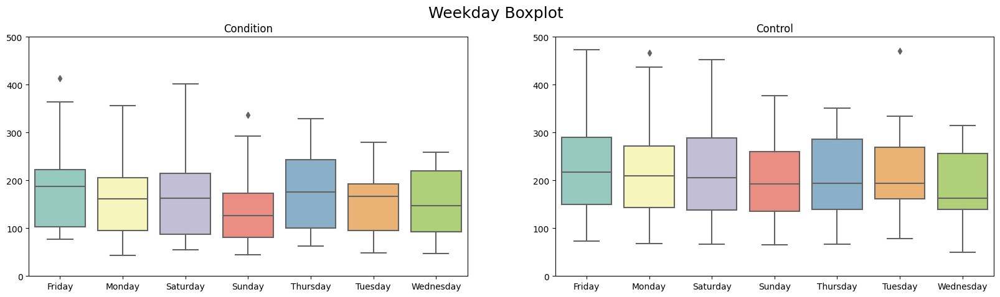

In [61]:
# Weekday Boxplots for each group
fig, axs = plt.subplots(ncols=2, figsize=(20, 5))
sns.boxplot(data = weekday_model.loc[weekday_model['depressed']==1].iloc[:,3:],  palette='Set3',  ax=axs[0])
axs[0].set_title('Condition')
axs[0].set_ylim(0,500)

sns.boxplot(data = weekday_model.loc[weekday_model['depressed']==0].iloc[:,3:],  palette='Set3',  ax=axs[1])
axs[1].set_title('Control')
axs[1].set_ylim(0,500)

plt.suptitle('Weekday Boxplot',fontsize=18)

plt.show()

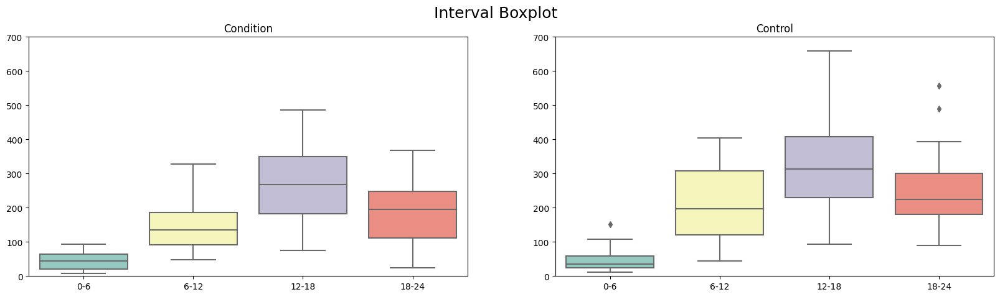

In [62]:
# Interval Boxplots for each group
fig, axs = plt.subplots(ncols=2, figsize=(20, 5))
sns.boxplot(data = interval_model.loc[interval_model['depressed']==1].iloc[:,3:],  palette='Set3',  ax=axs[0])
axs[0].set_title('Condition')
axs[0].set_ylim(0, 700)

sns.boxplot(data = interval_model.loc[interval_model['depressed']==0].iloc[:,3:],  palette='Set3',  ax=axs[1])
axs[1].set_title('Control')
axs[1].set_ylim(0, 700)
plt.suptitle('Interval Boxplot',fontsize=18)

plt.show()

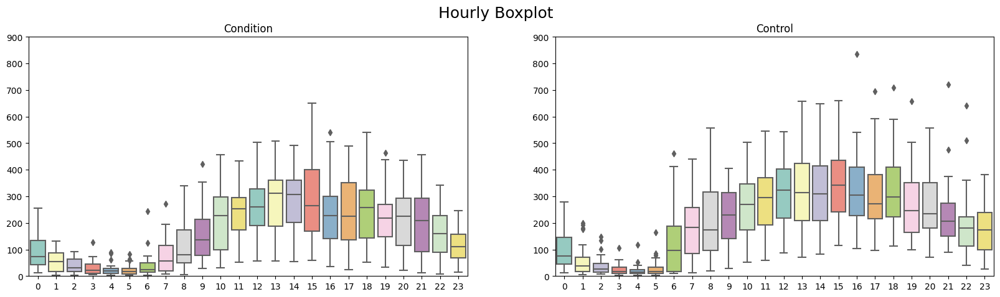

In [63]:
# Hourly Boxplots for each group
fig, axs = plt.subplots(ncols=2, figsize=(20, 5))
sns.boxplot(data = hourly_model.loc[hourly_model['depressed']==1].iloc[:,3:],  palette='Set3',  ax=axs[0])
axs[0].set_title('Condition')
axs[0].set_ylim(0,900)
sns.boxplot(data = hourly_model.loc[hourly_model['depressed']==0].iloc[:,3:],  palette='Set3',  ax=axs[1])
axs[1].set_title('Control')
axs[1].set_ylim(0,900)
plt.suptitle('Hourly Boxplot',fontsize=18)

plt.show()

## Feature Selection using tsfresh library <a class="anchor" id = "section_6"> </a>
<p style="text-align: justify;">
In this part of study, we use tsfresh package to create a new dataset. This library can be used to extract a range of features from time series data, including statistical features (such as mean, variance, and autocorrelation), Fourier transform-based features (such as frequency domain power spectra and peak frequencies), and features based on time-series models (such as ARIMA and state space models). 
In the following, we will extract a selection of statistical features (mean, standard deviation, variance, skewness, kurtosis, maximum, minimum, median, absolute sum of changes, longest strike above mean, longest strike below mean, count above mean, count below mean and autocorrelation) from our sensor data for each person using tsfresh. For each dataset 92 features are created. Then we clean the new dataset by removing the features with standard deviation of less than 0.05. After cleaning the near to zero values, 35 columns are removed. Then, we scale the data between 0 and 1. 
</p>
<p style="text-align: justify;">
The features creates some features over the index of each dataset. Regarding our study, these features are not informative and we remove them from our dataset.
</p>

In [64]:
#| code-fold: false
# Creating a function for extracting statistical features using tsfresh
from tsfresh.feature_extraction import extract_features, EfficientFCParameters
def feature_extraction(df):
    features = ['mean','standard_deviation','variance','skewness','kurtosis',
                'maximum','minimum','median','absolute_sum_of_changes','longest_strike_above_mean',
                'longest_strike_below_mean','count_above_mean','count_below_mean','autocorrelation']
    fc_parameters = EfficientFCParameters()
    fc_parameters_filtered = {feat: fc_parameters[feat] for feat in features if feat in fc_parameters}
    extracted_features = extract_features(df, column_id="number", column_sort="timestamp",default_fc_parameters=fc_parameters_filtered)
    extracted_features.reset_index(inplace=True)
    extracted_features.rename(columns={'index':'Datafile'},inplace=True)
    return extracted_features

In [65]:
# tsfresh features
# First of all, we select some importent feature of tsfresh, otherwise, we will have more than 750 features which would be hard to deal with.

tsfresh_df = {}
tsfresh_list = []
for i,name in enumerate(list(filled_dfs.keys())):
    df = filled_dfs[list(filled_dfs.keys())[i]]
    df = df.reset_index()
    df = df.reset_index()
    df.columns.name = None
    df = feature_extraction(df)
    tsfresh_df[name] = df
    tsfresh_list.append(df)


Feature Extraction: 100%|██████████| 4/4 [00:03<00:00,  1.19it/s]


In [66]:
tsfeatures = pd.concat(tsfresh_list, ignore_index=True)
tsfeatures = tsfeatures.rename(columns = {'Datafile':'number'})
tsfeatures.head()

,number,index__mean,index__standard_deviation,index__variance,index__skewness,index__kurtosis,index__maximum,index__minimum,index__median,index__absolute_sum_of_changes,...,fft__autocorrelation__lag_0,fft__autocorrelation__lag_1,fft__autocorrelation__lag_2,fft__autocorrelation__lag_3,fft__autocorrelation__lag_4,fft__autocorrelation__lag_5,fft__autocorrelation__lag_6,fft__autocorrelation__lag_7,fft__autocorrelation__lag_8,fft__autocorrelation__lag_9
0,condition_1,11621.5,6709.964822,4.502363e+07,0.0,-1.2,23243.0,0.0,11621.5,23243.0,...,1.0,0.428845,0.383771,0.384540,0.437382,0.381491,0.392197,0.446910,0.384587,0.436016
1,condition_10,10777.0,6222.392519,3.871817e+07,0.0,-1.2,21554.0,0.0,10777.0,21554.0,...,1.0,0.281962,0.257106,0.273901,0.288885,0.258235,0.249354,0.242493,0.255870,0.269205
2,condition_11,11494.5,6636.641338,4.404501e+07,0.0,-1.2,22989.0,0.0,11494.5,22989.0,...,1.0,0.439887,0.503167,0.404999,0.414722,0.427922,0.376940,0.402870,0.352075,0.411580
3,condition_12,11073.0,6393.288199,4.087413e+07,0.0,-1.2,22146.0,0.0,11073.0,22146.0,...,1.0,0.453247,0.378372,0.354516,0.351296,0.378307,0.330239,0.358804,0.360494,0.334582
4,condition_13,12954.5,7479.572732,5.594401e+07,0.0,-1.2,25909.0,0.0,12954.5,25909.0,...,1.0,0.368955,0.341136,0.359329,0.302751,0.320784,0.269274,0.271962,0.291101,0.324286


In [67]:
tsfeatures.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55 entries, 0 to 54
Data columns (total 93 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   number                               55 non-null     object 
 1   index__mean                          55 non-null     float64
 2   index__standard_deviation            55 non-null     float64
 3   index__variance                      55 non-null     float64
 4   index__skewness                      55 non-null     float64
 5   index__kurtosis                      55 non-null     float64
 6   index__maximum                       55 non-null     float64
 7   index__minimum                       55 non-null     float64
 8   index__median                        55 non-null     float64
 9   index__absolute_sum_of_changes       55 non-null     float64
 10  index__longest_strike_above_mean     55 non-null     float64
 11  index__longest_strike_below_mean  

In [68]:
#checking for missing values
print("Sum of the missing values in TSfresh features: ", sum(tsfeatures.isna().sum()))

Sum of the missing values in TSfresh features:  0


In [69]:
tsfresh_score = pd.merge(scoredf, tsfeatures, on = 'number').drop('number',axis=1)

In [70]:
# removing zerovariance columns
cols_to_drop = []
for col in tsfresh_score.columns:
    if tsfresh_score[col].std() < 0.05:
        cols_to_drop.append(col)
tsfresh_score = tsfresh_score.drop(cols_to_drop, axis=1)
tsfresh_score.head()

,gender,age_numeric,depressed,index__mean,index__standard_deviation,index__variance,index__maximum,index__median,index__absolute_sum_of_changes,index__longest_strike_above_mean,...,fft__count_below_mean,fft__autocorrelation__lag_1,fft__autocorrelation__lag_2,fft__autocorrelation__lag_3,fft__autocorrelation__lag_4,fft__autocorrelation__lag_5,fft__autocorrelation__lag_6,fft__autocorrelation__lag_7,fft__autocorrelation__lag_8,fft__autocorrelation__lag_9
0,1,37,1,11621.5,6709.964822,4.502363e+07,23243.0,11621.5,23243.0,11622.0,...,15903.0,0.428845,0.383771,0.384540,0.437382,0.381491,0.392197,0.446910,0.384587,0.436016
1,1,42,1,19462.5,11236.968286,1.262695e+08,38925.0,19462.5,38925.0,19463.0,...,26739.0,0.581278,0.468652,0.434727,0.446788,0.362825,0.355307,0.323393,0.327928,0.310079
2,0,47,1,10823.5,6249.239307,3.905299e+07,21647.0,10823.5,21647.0,10824.0,...,15281.0,0.323589,0.355088,0.309398,0.274155,0.293437,0.326220,0.275815,0.286995,0.328600
3,1,27,1,10777.5,6222.681195,3.872176e+07,21555.0,10777.5,21555.0,10778.0,...,14375.0,0.512339,0.385585,0.377913,0.389713,0.404378,0.358831,0.308601,0.317345,0.370275
4,1,52,1,10746.0,6204.494661,3.849575e+07,21492.0,10746.0,21492.0,10746.0,...,14694.0,0.368063,0.352426,0.335389,0.337658,0.306190,0.347292,0.341690,0.325995,0.346490


In [71]:
tsfresh_score.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
gender,55.0,4.545455e-01,5.025189e-01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
age_numeric,55.0,4.036364e+01,1.224951e+01,2.200000e+01,3.200000e+01,4.200000e+01,4.950000e+01,6.700000e+01
depressed,55.0,4.181818e-01,4.978066e-01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
index__mean,55.0,1.429046e+04,5.361588e+03,9.649000e+03,1.083050e+04,1.162150e+04,1.573900e+04,3.270300e+04
index__standard_deviation,55.0,8.250892e+03,3.095514e+03,5.571141e+03,6.253281e+03,6.709965e+03,9.087205e+03,1.888137e+04
index__variance,55.0,7.748520e+07,6.781737e+07,3.103762e+07,3.910352e+07,4.502363e+07,8.257729e+07,3.565063e+08
index__maximum,55.0,2.858093e+04,1.072318e+04,1.929800e+04,2.166100e+04,2.324300e+04,3.147800e+04,6.540600e+04
index__median,55.0,1.429046e+04,5.361588e+03,9.649000e+03,1.083050e+04,1.162150e+04,1.573900e+04,3.270300e+04
index__absolute_sum_of_changes,55.0,2.858093e+04,1.072318e+04,1.929800e+04,2.166100e+04,2.324300e+04,3.147800e+04,6.540600e+04
index__longest_strike_above_mean,55.0,1.429065e+04,5.361537e+03,9.649000e+03,1.083050e+04,1.162200e+04,1.573900e+04,3.270300e+04


In [72]:
# removing all the columns which contain index in their name
tsfresh_score= tsfresh_score.filter(regex='^(?!.*index)')

In [73]:
# Scaling the data between 0 and 1
from sklearn.preprocessing import MinMaxScaler
features = tsfresh_score.columns.values
scaler = MinMaxScaler(feature_range = (0,1))
scaledts = pd.DataFrame(scaler.fit_transform(tsfresh_score))
scaledts.columns = features
scaledts.head()

,gender,age_numeric,depressed,freq__longest_strike_above_mean,freq__longest_strike_below_mean,freq__count_above_mean,freq__count_below_mean,activity__mean,activity__standard_deviation,activity__variance,...,fft__count_below_mean,fft__autocorrelation__lag_1,fft__autocorrelation__lag_2,fft__autocorrelation__lag_3,fft__autocorrelation__lag_4,fft__autocorrelation__lag_5,fft__autocorrelation__lag_6,fft__autocorrelation__lag_7,fft__autocorrelation__lag_8,fft__autocorrelation__lag_9
0,1.0,0.333333,1.0,0.085542,0.085582,0.085542,0.085578,0.268024,0.324545,0.183811,...,0.090183,0.376706,0.498966,0.574641,0.808352,0.657466,0.602499,0.877313,0.737193,0.912010
1,1.0,0.444444,1.0,0.425671,0.425696,0.425671,0.425678,0.287539,0.398714,0.244803,...,0.446186,0.659252,0.769982,0.737423,0.840253,0.583571,0.479532,0.441192,0.509201,0.388716
2,0.0,0.555556,1.0,0.050926,0.050967,0.050926,0.050965,0.611884,0.540193,0.380734,...,0.069748,0.181606,0.407385,0.330918,0.254808,0.308886,0.382570,0.273201,0.344492,0.465674
3,1.0,0.111111,1.0,0.048931,0.048972,0.048931,0.048970,0.639681,0.634753,0.485914,...,0.039983,0.531468,0.504760,0.553147,0.646694,0.748068,0.491276,0.388964,0.466616,0.638841
4,1.0,0.666667,1.0,0.047543,0.047584,0.047543,0.047582,0.326998,0.332997,0.190405,...,0.050463,0.264042,0.398887,0.415220,0.470164,0.359370,0.452814,0.505796,0.501423,0.540011


<p style="text-align: justify;">
We devide our tsfresh extraxted features data into 3 parts, First are those related to the activity, second is fastfourier transformed coefficients and the third one are features related to the frequency of the data. then we use tham as the input of oir machine learning algorithm.
</p>

In [74]:
#| include: False
tsactivities = scaledts.filter(like='activity')
tsactivities.insert(0, 'gender', scaledts['gender'])
tsactivities.insert(1, 'age_numeric', scaledts['age_numeric'])
tsactivities.insert(2, 'depressed', scaledts['depressed'])
tsactivities.head()

,gender,age_numeric,depressed,activity__mean,activity__standard_deviation,activity__variance,activity__skewness,activity__kurtosis,activity__maximum,activity__minimum,...,activity__count_above_mean,activity__count_below_mean,activity__autocorrelation__lag_2,activity__autocorrelation__lag_3,activity__autocorrelation__lag_4,activity__autocorrelation__lag_5,activity__autocorrelation__lag_6,activity__autocorrelation__lag_7,activity__autocorrelation__lag_8,activity__autocorrelation__lag_9
0,1.0,0.333333,1.0,0.268024,0.324545,0.183811,0.563752,0.350736,0.326712,0.0,...,0.335719,0.082583,0.655267,0.623345,0.597122,0.587594,0.596272,0.602179,0.588791,0.603546
1,1.0,0.444444,1.0,0.287539,0.398714,0.244803,0.471416,0.229593,0.432355,0.0,...,0.733153,0.390735,0.790999,0.798196,0.798713,0.810198,0.822280,0.830030,0.843911,0.853893
2,0.0,0.555556,1.0,0.611884,0.540193,0.380734,0.106637,0.040270,0.375019,1.0,...,0.409183,0.030818,0.831402,0.818790,0.798411,0.770203,0.743255,0.727278,0.706390,0.688837
3,1.0,0.111111,1.0,0.639681,0.634753,0.485914,0.292114,0.188872,0.815801,0.0,...,0.369210,0.035752,0.655180,0.697134,0.716056,0.705865,0.696960,0.718948,0.750324,0.768515
4,1.0,0.666667,1.0,0.326998,0.332997,0.190405,0.354976,0.211827,0.489691,0.0,...,0.267117,0.052516,0.602473,0.582969,0.567335,0.552335,0.540254,0.537318,0.519660,0.509185


In [75]:
#| include: False
tsfft = scaledts.filter(like='fft')
tsfft.insert(0, 'gender', scaledts['gender'])
tsfft.insert(1, 'age_numeric', scaledts['age_numeric'])
tsfft.insert(2, 'depressed', scaledts['depressed'])
tsfft.head()

,gender,age_numeric,depressed,fft__mean,fft__standard_deviation,fft__variance,fft__skewness,fft__kurtosis,fft__maximum,fft__minimum,...,fft__count_below_mean,fft__autocorrelation__lag_1,fft__autocorrelation__lag_2,fft__autocorrelation__lag_3,fft__autocorrelation__lag_4,fft__autocorrelation__lag_5,fft__autocorrelation__lag_6,fft__autocorrelation__lag_7,fft__autocorrelation__lag_8,fft__autocorrelation__lag_9
0,1.0,0.333333,1.0,0.299060,0.288623,0.139135,0.331450,0.214995,0.179698,0.170819,...,0.090183,0.376706,0.498966,0.574641,0.808352,0.657466,0.602499,0.877313,0.737193,0.912010
1,1.0,0.444444,1.0,0.522716,0.514670,0.332809,0.436213,0.318565,0.410023,0.248340,...,0.446186,0.659252,0.769982,0.737423,0.840253,0.583571,0.479532,0.441192,0.509201,0.388716
2,0.0,0.555556,1.0,0.445931,0.518888,0.337129,0.620814,0.466741,0.388628,0.445932,...,0.069748,0.181606,0.407385,0.330918,0.254808,0.308886,0.382570,0.273201,0.344492,0.465674
3,1.0,0.111111,1.0,0.584412,0.562742,0.383590,0.510014,0.373537,0.404950,0.407567,...,0.039983,0.531468,0.504760,0.553147,0.646694,0.748068,0.491276,0.388964,0.466616,0.638841
4,1.0,0.666667,1.0,0.300185,0.288236,0.138867,0.431116,0.308107,0.195762,0.475135,...,0.050463,0.264042,0.398887,0.415220,0.470164,0.359370,0.452814,0.505796,0.501423,0.540011


In [76]:
#| include: False
tsfreq = scaledts.filter(like='freq')
tsfreq.insert(0, 'gender', scaledts['gender'])
tsfreq.insert(1, 'age_numeric', scaledts['age_numeric'])
tsfreq.insert(2, 'depressed', scaledts['depressed'])
tsfreq.head()

,gender,age_numeric,depressed,freq__longest_strike_above_mean,freq__longest_strike_below_mean,freq__count_above_mean,freq__count_below_mean
0,1.0,0.333333,1.0,0.085542,0.085582,0.085542,0.085578
1,1.0,0.444444,1.0,0.425671,0.425696,0.425671,0.425678
2,0.0,0.555556,1.0,0.050926,0.050967,0.050926,0.050965
3,1.0,0.111111,1.0,0.048931,0.048972,0.048931,0.048970
4,1.0,0.666667,1.0,0.047543,0.047584,0.047543,0.047582


## Classification Models <a class="anchor" id="section_7"></a>
<p style="text-align: justify;">
In this part of the project, we want to train a classification machine learning model. We will use the created features as input of our models and compare the classification metrics to see which features and which models provide better results.
For splitting the datasets into train and test, we generate random numbers for indcies. As the number of observation is not large, We set the proportion of the test dataset to 50%. Then we split each dataset using these indices. In this way we have the same rows as test and train samples and we keep the consistancy through out the process. 
</p>

<p style="text-align: justify;">
We created before 6 different datasets for hourly, interval and weekday activity features and tsfresh extracted features for activity, frequency and FFT. We fit our classification model seperately on these datasets and compare the results. The <b>depressed</b> feature is the target variable. We trained different classifiers such as <b>Logidtics Regression, Linear Discriminant Analysis (LDA), Decision Tree, K-Nearest Neighbor, Random Forest Classifier, GaussianNB, Support Vector Machine (SVM)</b> and <b>Multilayer Perceptron (MLP)</b>. For each classifier, different classification metrics were computed. In the following, a brief explanation of each metric is presented: 
</p>

* <b>Accuracy</b> Represents the percentage of correctly classified positive and negative samples. Can be misleading for imbalanced datasets and should be interpreted in combination with other metrics.

* <b>Precision</b> Depicts the fraction of true positives among those classified as positives. It is also called positive predictive value.

* <b>Recall</b> This metric is the correctly classified relevant samples. This tells us about how well the model identifies true positives.

* <b>F1-score</b> Harmonic mean of precision and recall.

* <b>ROC AUC</b> stands for curves receiver or operating characteristic curve. It illustrates in a binary classifier system the discrimination threshold created by plotting the true positive rate vs false positive rate. The perfect point is at the left top, where there are a lot of true positives and less false positives.
<p style="text-align: justify;">
For each classifier, different classification metrics include accuracy, precision, recall, F1 score, and ROC AUC were computed. The results are in the following table. By comparing the models based on overall performance (ROC AUC and Accuracy), the SVM model trained by Hourly Activity features had the highest Accuracy and ROC AUC of 81% and 80%, respectively. Regarding to the confudion matrix, SVM has predicted 10 out of 11 non-depressed individual and 12 out of 16 depressed individual correctly. But 4 depressed individuals were classified as non-depressed and 1 non-depressed individual was classified as depressed one. The second highest Accuracy and ROC AUC of 81% and 78% was for the Support Vector Machine on  Hourly Activity. The third highest Accuracy of 78% and ROC AUC of 70% were again for the Logistic Regression model trained by TSfresh Frequency features and Decision Tree and Random Forest on TSfresh FFT Feature.
</p>

| Classifier | Metrics   | Hourly Activity | 6-Hour Interval Activity | Weekday Activity | TSfresh Activity | TSfresh Frequency | TSfresh FFT |
|------------|-----------|-----------------|--------------------------|------------------|------------------|-------------------|-------------|
| LR         | Accuracy  | 0.81            | 0.67                     | 0.7              | 0.74             | 0.78              | 0.7         |
| LR         | Precision | 0.75            | 0.6                      | 0.71             | 0.67             | 0.78              | 0.64        |
| LR         | Recall    | 0.82            | 0.55                     | 0.45             | 0.73             | 0.64              | 0.64        |
| LR         | F1 Score  | 0.78            | 0.57                     | 0.56             | 0.7              | 0.7               | 0.64        |
| LR         | ROC AUC   | 0.78            | 0.57                     | 0.56             | 0.7              | 0.7               | 0.64        |
| LDA        | Accuracy  | 0.52            | 0.63                     | 0.67             | 0.63             | 0.56              | 0.63        |
| LDA        | Precision | 0.44            | 0.56                     | 0.62             | 0.53             | 0.47              | 0.54        |
| LDA        | Recall    | 0.64            | 0.45                     | 0.45             | 0.73             | 0.64              | 0.64        |
| LDA        | F1 Score  | 0.52            | 0.5                      | 0.53             | 0.62             | 0.54              | 0.58        |
| LDA        | ROC AUC   | 0.52            | 0.5                      | 0.53             | 0.62             | 0.54              | 0.58        |
| KNN        | Accuracy  | 0.78            | 0.59                     | 0.52             | 0.78             | 0.48              | 0.74        |
| KNN        | Precision | 1               | 0.5                      | 0                | 1                | 0.33              | 0.83        |
| KNN        | Recall    | 0.45            | 0.27                     | 0                | 0.45             | 0.27              | 0.45        |
| KNN        | F1 Score  | 0.62            | 0.35                     | 0                | 0.62             | 0.3               | 0.59        |
| KNN        | ROC AUC   | 0.62            | 0.35                     | 0                | 0.62             | 0.3               | 0.59        |
| DTC        | Accuracy  | 0.56            | 0.52                     | 0.48             | 0.48             | 0.59              | 0.78        |
| DTC        | Precision | 0.45            | 0.33                     | 0.29             | 0.41             | 0.5               | 0.78        |
| DTC        | Recall    | 0.45            | 0.18                     | 0.18             | 0.64             | 0.45              | 0.64        |
| DTC        | F1 Score  | 0.45            | 0.24                     | 0.22             | 0.5              | 0.48              | 0.7         |
| DTC        | ROC AUC   | 0.45            | 0.24                     | 0.22             | 0.5              | 0.48              | 0.7         |
| RFM        | Accuracy  | 0.67            | 0.56                     | 0.67             | 0.56             | 0.67              | 0.78        |
| RFM        | Precision | 0.62            | 0.44                     | 0.62             | 0.45             | 0.58              | 0.78        |
| RFM        | Recall    | 0.45            | 0.36                     | 0.45             | 0.45             | 0.64              | 0.64        |
| RFM        | F1 Score  | 0.53            | 0.4                      | 0.53             | 0.45             | 0.61              | 0.7         |
| RFM        | ROC AUC   | 0.53            | 0.4                      | 0.53             | 0.45             | 0.61              | 0.7         |
| NB         | Accuracy  | 0.67            | 0.59                     | 0.67             | 0.7              | 0.63              | 0.63        |
| NB         | Precision | 0.56            | 0.5                      | 0.57             | 0.64             | 0.57              | 0.53        |
| NB         | Recall    | 0.91            | 0.73                     | 0.73             | 0.64             | 0.36              | 0.91        |
| NB         | F1 Score  | 0.69            | 0.59                     | 0.64             | 0.64             | 0.44              | 0.67        |
| NB         | ROC AUC   | 0.69            | 0.59                     | 0.64             | 0.64             | 0.44              | 0.67        |
| MLP        | Accuracy  | 0.59            | 0.52                     | 0.63             | 0.74             | 0.74              | 0.7         |
| MLP        | Precision | 0.5             | 0.43                     | 0.56             | 0.67             | 0.7               | 0.64        |
| MLP        | Recall    | 0.55            | 0.55                     | 0.45             | 0.73             | 0.64              | 0.64        |
| MLP        | F1 Score  | 0.52            | 0.48                     | 0.5              | 0.7              | 0.67              | 0.64        |
| MLP        | ROC AUC   | 0.52            | 0.48                     | 0.5              | 0.7              | 0.67              | 0.64        |
| SVM        | Accuracy  | 0.81            | 0.44                     | 0.67             | 0.7              | 0.59              | 0.59        |
| SVM        | Precision | 0.71            | 0.17                     | 0.67             | 1                | 0                 | 0           |
| SVM        | Recall    | 0.91            | 0.09                     | 0.36             | 0.27             | 0                 | 0           |
| SVM        | F1 Score  | 0.8             | 0.12                     | 0.47             | 0.43             | 0                 | 0           |
| SVM        | ROC AUC   | 0.8             | 0.12                     | 0.47             | 0.43             | 0                 | 0           |


In [107]:
import random
random.seed(10)

indices = list(range(scoredf.shape[0]))
random.shuffle(indices)

test_proportion = 0.4

test_size = int(scoredf.shape[0]* test_proportion)

train_indices = indices[test_size:]
test_indices = indices[:test_size]


In [116]:
models = []
models.append(('LR', LogisticRegression(n_jobs=-1, C = 10)))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('DTC', DecisionTreeClassifier()))
models.append(('RFM', RandomForestClassifier(n_jobs=-1, max_depth= 5, n_estimators= 100)))
models.append(('NB', GaussianNB()))
models.append(('MLP', MLPClassifier(max_iter=100, hidden_layer_sizes= (50, 50))))
models.append(('SVM', SVC(C = 0.1, kernel= 'linear')))


In [117]:
# Choosing model using cross validation
x = hourly_model.drop(['age_numeric','gender','depressed'],axis=1)
y = hourly_model['depressed']

xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.4, random_state=42)

kfold = KFold(n_splits=10, shuffle=True, random_state=42)

results = []
names = []
# scoring = 'accuracy' or 'roc_auc' or 'precision'
for name, model in models:
    kfold = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_results = cross_val_score(model, xtrain, ytrain, cv=kfold, scoring= 'accuracy')
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.733333 (0.160357)
LDA: 0.604762 (0.148767)
KNN: 0.600000 (0.143174)
DTC: 0.490476 (0.181703)
RFM: 0.580952 (0.163992)
NB: 0.685714 (0.160357)
MLP: 0.757143 (0.147849)
SVM: 0.733333 (0.160357)


In [141]:
# Finding the best parameters for hourly_model

x = hourly_model.drop(['age_numeric','gender','depressed'],axis=1)
y = hourly_model['depressed']

xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.5, random_state=42)


# Logistic Regression (LR)
param_grid_lr = {
    'C': [0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga']
}

lr = LogisticRegression()

grid_search_lr = GridSearchCV(lr, param_grid_lr, cv=5)
grid_search_lr.fit(xtrain, ytrain)

best_params_lr = grid_search_lr.best_params_
best_score_lr = grid_search_lr.best_score_

# K-Nearest Neighbors (KNN)
param_grid_knn = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

knn = KNeighborsClassifier()
grid_search_knn = GridSearchCV(knn, param_grid_knn, cv=5)
grid_search_knn.fit(xtrain, ytrain)

best_params_knn = grid_search_knn.best_params_
best_score_knn = grid_search_knn.best_score_

# Decision Tree Classifier (DT)
param_grid_dt = {
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

dt = DecisionTreeClassifier()
grid_search_dt = GridSearchCV(dt, param_grid_dt, cv=5)
grid_search_dt.fit(xtrain, ytrain)

best_params_dt = grid_search_dt.best_params_
best_score_dt = grid_search_dt.best_score_


# Random Forest Classifier (RFC)
param_grid_rfc = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

rfc = RandomForestClassifier()
grid_search_rfc = GridSearchCV(rfc, param_grid_rfc, cv=5)
grid_search_rfc.fit(xtrain, ytrain)

best_params_rfc = grid_search_rfc.best_params_
best_score_rfc = grid_search_rfc.best_score_

# Multi-Layer Perceptron (MLP)
param_grid_mlp = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50)],
    'activation': ['relu', 'tanh'],
    'alpha': [0.0001, 0.001, 0.01]
}

mlp = MLPClassifier()

grid_search_mlp = GridSearchCV(mlp, param_grid_mlp, cv=5)
grid_search_mlp.fit(xtrain, ytrain)

best_params_mlp = grid_search_mlp.best_params_
best_score_mlp = grid_search_mlp.best_score_

# Support Vector Machine (SVM)
param_grid_svm = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

svm = SVC()

grid_search_svm = GridSearchCV(svm, param_grid_svm, cv=5)
grid_search_svm.fit(xtrain, ytrain)

best_params_svm = grid_search_svm.best_params_
best_score_svm = grid_search_svm.best_score_

# Print the best hyperparameters and scores for each model
print("Logistic Regression:")
print("Best Parameters:", best_params_lr)
print("Best Score:", best_score_lr)
print("")

print("K Nearest Neighbor:")
print("Best Parameters:", best_params_knn)
print("Best Score:", best_score_knn)
print("")

print("Decision Tree:")
print("Best Parameters:", best_params_dt)
print("Best Score:", best_score_dt)
print("")

print("Random Forest Classifier:")
print("Best Parameters:", best_params_rfc)
print("Best Score:", best_score_rfc)
print("")

print("Multi-Layer Perceptron:")
print("Best Parameters:", best_params_mlp)
print("Best Score:", best_score_mlp)
print("")

print("Support Vector Machine:")
print("Best Parameters:", best_params_svm)
print("Best Score:", best_score_svm)


Logistic Regression:
Best Parameters: {'C': 10, 'penalty': 'l1', 'solver': 'liblinear'}
Best Score: 0.7799999999999999

K Nearest Neighbor:
Best Parameters: {'metric': 'manhattan', 'n_neighbors': 5, 'weights': 'uniform'}
Best Score: 0.6333333333333333

Decision Tree:
Best Parameters: {'max_depth': 10, 'min_samples_split': 10}
Best Score: 0.7066666666666667

Random Forest Classifier:
Best Parameters: {'max_depth': 5, 'min_samples_split': 10, 'n_estimators': 100}
Best Score: 0.7066666666666668

Multi-Layer Perceptron:
Best Parameters: {'activation': 'tanh', 'alpha': 0.01, 'hidden_layer_sizes': (50, 50)}
Best Score: 0.8866666666666667

Support Vector Machine:
Best Parameters: {'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'}
Best Score: 0.6666666666666667


In [142]:
models = []
lr_best = LogisticRegression().set_params(**best_params_lr)
mlp_best = MLPClassifier().set_params(**best_params_mlp)
svm_best = SVC().set_params(**best_params_svm)
rfc_best = RandomForestClassifier().set_params(**best_params_rfc)
dt_best = DecisionTreeClassifier().set_params(**best_params_dt)
knn_best = KNeighborsClassifier().set_params(**best_params_knn)

models.append(('LR', lr_best))
models.append(('MLP', mlp_best))
models.append(('SVM', svm_best))
models.append(('RFC', rfc_best))
models.append(('DT', dt_best))
models.append(('KNN', knn_best))

# Evaluate each model
for name, model in models:
    model.fit(xtrain,ytrain)
    ypred = model.predict(xtest)
    
    accuracy = accuracy_score(ytest, ypred) * 100
    precision = precision_score(ytest, ypred) * 100
    recall = recall_score(ytest, ypred) * 100
    f1 = f1_score(ytest, ypred) * 100
    roc_auc = roc_auc_score(ytest, ypred) * 100
    
    print('Classifier:', name)
    print('Accuracy: %.0f%%' % accuracy)
    print('Precision: %.0f%%' % precision)
    print('Recall: %.0f%%' % recall)
    print('F1 Score: %.0f%%' % f1)
    print('ROC AUC: %.0f%%' % f1)

    cm = confusion_matrix(ytest, ypred)
    print('Confusion Matrix:')
    print(cm)
    print()

Classifier: LR
Accuracy: 57%
Precision: 50%
Recall: 50%
F1 Score: 50%
ROC AUC: 50%
Confusion Matrix:
[[10  6]
 [ 6  6]]

Classifier: MLP
Accuracy: 68%
Precision: 62%
Recall: 67%
F1 Score: 64%
ROC AUC: 64%
Confusion Matrix:
[[11  5]
 [ 4  8]]

Classifier: SVM
Accuracy: 64%
Precision: 60%
Recall: 50%
F1 Score: 55%
ROC AUC: 55%
Confusion Matrix:
[[12  4]
 [ 6  6]]

Classifier: RFC
Accuracy: 57%
Precision: 50%
Recall: 42%
F1 Score: 45%
ROC AUC: 45%
Confusion Matrix:
[[11  5]
 [ 7  5]]

Classifier: DT
Accuracy: 64%
Precision: 58%
Recall: 58%
F1 Score: 58%
ROC AUC: 58%
Confusion Matrix:
[[11  5]
 [ 5  7]]

Classifier: KNN
Accuracy: 61%
Precision: 60%
Recall: 25%
F1 Score: 35%
ROC AUC: 35%
Confusion Matrix:
[[14  2]
 [ 9  3]]



In [130]:
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('DTC', DecisionTreeClassifier()))
models.append(('RFM', RandomForestClassifier(n_jobs=-1, max_depth= 5, n_estimators= 100)))
models.append(('NB', GaussianNB()))

In [131]:
models = []
lr_best = LogisticRegression().set_params(**best_params_lr)
mlp_best = MLPClassifier().set_params(**best_params_mlp)
svm_best = SVC().set_params(**best_params_svm)

models.append(('LR', lr_best))
models.append(('MLP', mlp_best))
models.append(('SVM', svm_best))


In [133]:
for name, model in models:
    model.fit(xtrain,ytrain)
    ypred = model.predict(xtest)
    
    accuracy = accuracy_score(ytest, ypred) * 100
    precision = precision_score(ytest, ypred) * 100
    recall = recall_score(ytest, ypred) * 100
    f1 = f1_score(ytest, ypred) * 100
    roc_auc = roc_auc_score(ytest, ypred) * 100
    
    print('Classifier:', name)
    print('Accuracy: %.0f%%' % accuracy)
    print('Precision: %.0f%%' % precision)
    print('Recall: %.0f%%' % recall)
    print('F1 Score: %.0f%%' % f1)
    print('ROC AUC: %.0f%%' % f1)

    cm = confusion_matrix(ytest, ypred)
    print('Confusion Matrix:')
    print(cm)
    print()

Classifier: LR
Accuracy: 59%
Precision: 50%
Recall: 44%
F1 Score: 47%
ROC AUC: 47%
Confusion Matrix:
[[9 4]
 [5 4]]

Classifier: MLP
Accuracy: 55%
Precision: 40%
Recall: 22%
F1 Score: 29%
ROC AUC: 29%
Confusion Matrix:
[[10  3]
 [ 7  2]]

Classifier: SVM
Accuracy: 59%
Precision: 50%
Recall: 56%
F1 Score: 53%
ROC AUC: 53%
Confusion Matrix:
[[8 5]
 [4 5]]



In [114]:
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('DTC', DecisionTreeClassifier()))
models.append(('RFM', RandomForestClassifier()))
models.append(('NB', GaussianNB()))
models.append(('MLP', MLPClassifier()))
models.append(('SVM', SVC()))


In [110]:
# classification models for Hourly Activity
x = hourly_model.drop(['age_numeric','gender','depressed'],axis=1)
# x = hourly_model.drop('depressed',axis=1)
y = hourly_model['depressed']

print('Feature: Hourly Activity\n')


xtrain = x.iloc[train_indices,:]
xtest = x.iloc[test_indices,:]
ytrain = y.iloc[train_indices]
ytest = y.iloc[test_indices]


# xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.5, random_state=42)

for name, model in models:
    model.fit(xtrain,ytrain)
    ypred = model.predict(xtest)
    
    accuracy = accuracy_score(ytest, ypred) * 100
    precision = precision_score(ytest, ypred) * 100
    recall = recall_score(ytest, ypred) * 100
    f1 = f1_score(ytest, ypred) * 100
    roc_auc = roc_auc_score(ytest, ypred) * 100
    
    print('Classifier:', name)
    print('Accuracy: %.0f%%' % accuracy)
    print('Precision: %.0f%%' % precision)
    print('Recall: %.0f%%' % recall)
    print('F1 Score: %.0f%%' % f1)
    print('ROC AUC: %.0f%%' % f1)

    cm = confusion_matrix(ytest, ypred)
    print('Confusion Matrix:')
    print(cm)
    print()


Feature: Hourly Activity

Classifier: LR
Accuracy: 68%
Precision: 60%
Recall: 67%
F1 Score: 63%
ROC AUC: 63%
Confusion Matrix:
[[9 4]
 [3 6]]

Classifier: LDA
Accuracy: 68%
Precision: 57%
Recall: 89%
F1 Score: 70%
ROC AUC: 70%
Confusion Matrix:
[[7 6]
 [1 8]]

Classifier: KNN
Accuracy: 64%
Precision: 56%
Recall: 56%
F1 Score: 56%
ROC AUC: 56%
Confusion Matrix:
[[9 4]
 [4 5]]

Classifier: DTC
Accuracy: 55%
Precision: 43%
Recall: 33%
F1 Score: 38%
ROC AUC: 38%
Confusion Matrix:
[[9 4]
 [6 3]]

Classifier: RFM
Accuracy: 55%
Precision: 40%
Recall: 22%
F1 Score: 29%
ROC AUC: 29%
Confusion Matrix:
[[10  3]
 [ 7  2]]

Classifier: NB
Accuracy: 68%
Precision: 60%
Recall: 67%
F1 Score: 63%
ROC AUC: 63%
Confusion Matrix:
[[9 4]
 [3 6]]

Classifier: MLP
Accuracy: 73%
Precision: 71%
Recall: 56%
F1 Score: 63%
ROC AUC: 63%
Confusion Matrix:
[[11  2]
 [ 4  5]]

Classifier: SVM
Accuracy: 73%
Precision: 64%
Recall: 78%
F1 Score: 70%
ROC AUC: 70%
Confusion Matrix:
[[9 4]
 [2 7]]



In [133]:
ytest.value_counts()

0    16
1    11
Name: depressed, dtype: int64

In [105]:
# classification models for Interval Activity
x = interval_model.drop('depressed',axis=1)
# x = interval_model.drop(['age_numeric','gender','depressed'],axis=1)
y = interval_model['depressed']

print('Feature: Interval Activity\n')

xtrain = x.iloc[train_indices,:]
xtest = x.iloc[test_indices,:]
ytrain = y.iloc[train_indices]
ytest = y.iloc[test_indices]

for name, model in models:
    model.fit(xtrain,ytrain)
    ypred = model.predict(xtest)
    
    accuracy = accuracy_score(ytest, ypred) * 100
    precision = precision_score(ytest, ypred) * 100
    recall = recall_score(ytest, ypred) * 100
    f1 = f1_score(ytest, ypred) * 100
    roc_auc = roc_auc_score(ytest, ypred) * 100
    
    print('Classifier:', name)
    print('Accuracy: %.0f%%' % accuracy)
    print('Precision: %.0f%%' % precision)
    print('Recall: %.0f%%' % recall)
    print('F1 Score: %.0f%%' % f1)
    print('ROC AUC: %.0f%%' % f1)
    print()


Feature: Interval Activity

Classifier: LR
Accuracy: 67%
Precision: 60%
Recall: 55%
F1 Score: 57%
ROC AUC: 57%

Classifier: LDA
Accuracy: 63%
Precision: 56%
Recall: 45%
F1 Score: 50%
ROC AUC: 50%

Classifier: KNN
Accuracy: 59%
Precision: 50%
Recall: 27%
F1 Score: 35%
ROC AUC: 35%

Classifier: DTC
Accuracy: 52%
Precision: 33%
Recall: 18%
F1 Score: 24%
ROC AUC: 24%

Classifier: RFM
Accuracy: 56%
Precision: 44%
Recall: 36%
F1 Score: 40%
ROC AUC: 40%

Classifier: NB
Accuracy: 59%
Precision: 50%
Recall: 73%
F1 Score: 59%
ROC AUC: 59%

Classifier: MLP
Accuracy: 52%
Precision: 43%
Recall: 55%
F1 Score: 48%
ROC AUC: 48%

Classifier: SVM
Accuracy: 44%
Precision: 17%
Recall: 9%
F1 Score: 12%
ROC AUC: 12%



In [108]:
# classification models for Weekday Activity
x = weekday_model.drop('depressed',axis=1)
# x = weekday_model.drop(['age_numeric','gender','depressed'],axis=1)
y = weekday_model['depressed']

print('Feature: Weekday Activity\n')

xtrain = x.iloc[train_indices,:]
xtest = x.iloc[test_indices,:]
ytrain = y.iloc[train_indices]
ytest = y.iloc[test_indices]

for name, model in models:
    model.fit(xtrain,ytrain)
    ypred = model.predict(xtest)
    
    accuracy = accuracy_score(ytest, ypred) * 100
    precision = precision_score(ytest, ypred) * 100
    recall = recall_score(ytest, ypred) * 100
    f1 = f1_score(ytest, ypred) * 100
    roc_auc = roc_auc_score(ytest, ypred) * 100
    
    print('Classifier:', name)
    print('Accuracy: %.0f%%' % accuracy)
    print('Precision: %.0f%%' % precision)
    print('Recall: %.0f%%' % recall)
    print('F1 Score: %.0f%%' % f1)
    print('ROC AUC: %.0f%%' % f1)
    print()


Feature: Weekday Activity

Classifier: LR
Accuracy: 70%
Precision: 71%
Recall: 45%
F1 Score: 56%
ROC AUC: 56%

Classifier: LDA
Accuracy: 67%
Precision: 62%
Recall: 45%
F1 Score: 53%
ROC AUC: 53%

Classifier: KNN
Accuracy: 52%
Precision: 0%
Recall: 0%
F1 Score: 0%
ROC AUC: 0%

Classifier: DTC
Accuracy: 48%
Precision: 29%
Recall: 18%
F1 Score: 22%
ROC AUC: 22%

Classifier: RFM
Accuracy: 67%
Precision: 62%
Recall: 45%
F1 Score: 53%
ROC AUC: 53%

Classifier: NB
Accuracy: 67%
Precision: 57%
Recall: 73%
F1 Score: 64%
ROC AUC: 64%

Classifier: MLP
Accuracy: 63%
Precision: 56%
Recall: 45%
F1 Score: 50%
ROC AUC: 50%

Classifier: SVM
Accuracy: 67%
Precision: 67%
Recall: 36%
F1 Score: 47%
ROC AUC: 47%



In [121]:
# classification models for TSfresh Activity Features

x = scaledts.drop('depressed',axis=1)
# x = scaledts.drop(['age_numeric','gender','depressed'],axis=1)
y = scaledts['depressed']

print('TSfresh Scaled Features\n')

xtrain = x.iloc[train_indices,:]
xtest = x.iloc[test_indices,:]
ytrain = y.iloc[train_indices]
ytest = y.iloc[test_indices]

for name, model in models:
    model.fit(xtrain,ytrain)
    ypred = model.predict(xtest)
    
    accuracy = accuracy_score(ytest, ypred) * 100
    precision = precision_score(ytest, ypred) * 100
    recall = recall_score(ytest, ypred) * 100
    f1 = f1_score(ytest, ypred) * 100
    roc_auc = roc_auc_score(ytest, ypred) * 100
    
    print('Classifier:', name)
    print('Accuracy: %.0f%%' % accuracy)
    print('Precision: %.0f%%' % precision)
    print('Recall: %.0f%%' % recall)
    print('F1 Score: %.0f%%' % f1)
    print('ROC AUC: %.0f%%' % f1)
    print()

TSfresh Scaled Features

Classifier: LR
Accuracy: 74%
Precision: 67%
Recall: 73%
F1 Score: 70%
ROC AUC: 70%

Classifier: LDA
Accuracy: 63%
Precision: 53%
Recall: 73%
F1 Score: 62%
ROC AUC: 62%

Classifier: KNN
Accuracy: 78%
Precision: 100%
Recall: 45%
F1 Score: 62%
ROC AUC: 62%

Classifier: DTC
Accuracy: 41%
Precision: 35%
Recall: 55%
F1 Score: 43%
ROC AUC: 43%

Classifier: RFM
Accuracy: 56%
Precision: 47%
Recall: 64%
F1 Score: 54%
ROC AUC: 54%

Classifier: NB
Accuracy: 70%
Precision: 64%
Recall: 64%
F1 Score: 64%
ROC AUC: 64%

Classifier: MLP
Accuracy: 70%
Precision: 62%
Recall: 73%
F1 Score: 67%
ROC AUC: 67%

Classifier: SVM
Accuracy: 70%
Precision: 100%
Recall: 27%
F1 Score: 43%
ROC AUC: 43%



In [123]:
# classification models for TSfresh Activity Features

x = tsactivities.drop('depressed',axis=1)
# x = tsactivities.drop(['age_numeric','gender','depressed'],axis=1)
y = tsactivities['depressed']

print('TSfresh Activity Features\n')

xtrain = x.iloc[train_indices,:]
xtest = x.iloc[test_indices,:]
ytrain = y.iloc[train_indices]
ytest = y.iloc[test_indices]

for name, model in models:
    model.fit(xtrain,ytrain)
    ypred = model.predict(xtest)
    
    accuracy = accuracy_score(ytest, ypred) * 100
    precision = precision_score(ytest, ypred) * 100
    recall = recall_score(ytest, ypred) * 100
    f1 = f1_score(ytest, ypred) * 100
    roc_auc = roc_auc_score(ytest, ypred) * 100
    
    print('Classifier:', name)
    print('Accuracy: %.0f%%' % accuracy)
    print('Precision: %.0f%%' % precision)
    print('Recall: %.0f%%' % recall)
    print('F1 Score: %.0f%%' % f1)
    print('ROC AUC: %.0f%%' % f1)
    print()

TSfresh Activity Features

Classifier: LR
Accuracy: 78%
Precision: 78%
Recall: 64%
F1 Score: 70%
ROC AUC: 70%

Classifier: LDA
Accuracy: 56%
Precision: 47%
Recall: 64%
F1 Score: 54%
ROC AUC: 54%

Classifier: KNN
Accuracy: 48%
Precision: 33%
Recall: 27%
F1 Score: 30%
ROC AUC: 30%

Classifier: DTC
Accuracy: 63%
Precision: 56%
Recall: 45%
F1 Score: 50%
ROC AUC: 50%

Classifier: RFM
Accuracy: 63%
Precision: 55%
Recall: 55%
F1 Score: 55%
ROC AUC: 55%

Classifier: NB
Accuracy: 63%
Precision: 57%
Recall: 36%
F1 Score: 44%
ROC AUC: 44%

Classifier: MLP
Accuracy: 74%
Precision: 70%
Recall: 64%
F1 Score: 67%
ROC AUC: 67%

Classifier: SVM
Accuracy: 59%
Precision: 0%
Recall: 0%
F1 Score: 0%
ROC AUC: 0%



In [124]:
# classification models for TSfresh Frequency Features
# x = tsfreq.drop('depressed',axis=1)
x = tsfreq.drop(['age_numeric','gender','depressed'],axis=1)
y = tsfreq['depressed']

print('TSfresh Frequency Features\n')

xtrain = x.iloc[train_indices,:]
xtest = x.iloc[test_indices,:]
ytrain = y.iloc[train_indices]
ytest = y.iloc[test_indices]

for name, model in models:
    model.fit(xtrain,ytrain)
    ypred = model.predict(xtest)
    
    accuracy = accuracy_score(ytest, ypred) * 100
    precision = precision_score(ytest, ypred) * 100
    recall = recall_score(ytest, ypred) * 100
    f1 = f1_score(ytest, ypred) * 100
    roc_auc = roc_auc_score(ytest, ypred) * 100
    
    print('Classifier:', name)
    print('Accuracy: %.0f%%' % accuracy)
    print('Precision: %.0f%%' % precision)
    print('Recall: %.0f%%' % recall)
    print('F1 Score: %.0f%%' % f1)
    print('ROC AUC: %.0f%%' % f1)
    print()

TSfresh Frequency Features

Classifier: LR
Accuracy: 70%
Precision: 64%
Recall: 64%
F1 Score: 64%
ROC AUC: 64%

Classifier: LDA
Accuracy: 63%
Precision: 54%
Recall: 64%
F1 Score: 58%
ROC AUC: 58%

Classifier: KNN
Accuracy: 74%
Precision: 83%
Recall: 45%
F1 Score: 59%
ROC AUC: 59%

Classifier: DTC
Accuracy: 78%
Precision: 78%
Recall: 64%
F1 Score: 70%
ROC AUC: 70%

Classifier: RFM
Accuracy: 78%
Precision: 78%
Recall: 64%
F1 Score: 70%
ROC AUC: 70%

Classifier: NB
Accuracy: 63%
Precision: 53%
Recall: 91%
F1 Score: 67%
ROC AUC: 67%

Classifier: MLP
Accuracy: 70%
Precision: 64%
Recall: 64%
F1 Score: 64%
ROC AUC: 64%

Classifier: SVM
Accuracy: 59%
Precision: 0%
Recall: 0%
F1 Score: 0%
ROC AUC: 0%



In [125]:
# classification models for TSfresh FFT Features

x = tsfft.drop('depressed', axis =1)
y = tsfft['depressed']

print('TSfresh FFT Features')
print()

xtrain = x.iloc[train_indices,:]
xtest = x.iloc[test_indices,:]
ytrain = y.iloc[train_indices]
ytest = y.iloc[test_indices]

for name, model in models:
    model.fit(xtrain,ytrain)
    ypred = model.predict(xtest)
    
    accuracy = accuracy_score(ytest, ypred) * 100
    precision = precision_score(ytest, ypred) * 100
    recall = recall_score(ytest, ypred) * 100
    f1 = f1_score(ytest, ypred) * 100
    roc_auc = roc_auc_score(ytest, ypred) * 100
    
    print('Classifier:', name)
    print('Accuracy: %.0f%%' % accuracy)
    print('Precision: %.0f%%' % precision)
    print('Recall: %.0f%%' % recall)
    print('F1 Score: %.0f%%' % f1)
    print('ROC AUC: %.0f%%' % f1)
    print()

TSfresh FFT Features

Classifier: LR
Accuracy: 70%
Precision: 64%
Recall: 64%
F1 Score: 64%
ROC AUC: 64%

Classifier: LDA
Accuracy: 78%
Precision: 73%
Recall: 73%
F1 Score: 73%
ROC AUC: 73%

Classifier: KNN
Accuracy: 59%
Precision: 50%
Recall: 36%
F1 Score: 42%
ROC AUC: 42%

Classifier: DTC
Accuracy: 48%
Precision: 38%
Recall: 45%
F1 Score: 42%
ROC AUC: 42%

Classifier: RFM
Accuracy: 59%
Precision: 50%
Recall: 55%
F1 Score: 52%
ROC AUC: 52%

Classifier: NB
Accuracy: 59%
Precision: 50%
Recall: 73%
F1 Score: 59%
ROC AUC: 59%

Classifier: MLP
Accuracy: 81%
Precision: 88%
Recall: 64%
F1 Score: 74%
ROC AUC: 74%

Classifier: SVM
Accuracy: 59%
Precision: 0%
Recall: 0%
F1 Score: 0%
ROC AUC: 0%



## Conclusion
<p style="text-align: justify;">
In conclusion, the analysis and classification of depression using the dataset obtained from the provided link have provided valuable insights. The activity data extracted from the sensor data showed promising potential as a feature for diagnosing depression in patients. The results obtained through machine learning algorithms demonstrated the feasibility of performing classification based on the available features.
</p>
<p style="text-align: justify;">
However, it is important to note that the limited number of observations available for training the model, which amounted to 55, may have impacted the overall reliability and generalizability of the results. As the numbetr of observations is small, the ratio of splitting data into train and test affects the result of the classification metrics. With a larger dataset, the model's performance could potentially be improved, and the results could be more robust and accurate. 
Additionally, it is worth considering that depression is a complex mental health condition influenced by various factors, and activity level alone might not capture the complete picture. Incorporating additional information, such as psychological questionnaire data, could enhance the accuracy and reliability of the classification results.
</p>
<p style="text-align: justify;">
Furthermore, it is essential to acknowledge that the dataset used in this analysis was collected in 2010. Given the advancements in technology and data collection techniques, more accurate and comprehensive data can now be obtained. Access to up-to-date and high-quality data would greatly contribute to better understanding and diagnosing depression.
To conclude, while the activity data extracted from the sensor data holds promise as a feature for depression diagnosis, further research with larger datasets and the inclusion of diverse data sources is warranted to enhance the reliability and accuracy of classification models in diagnosing depression.
</p>

## References

Arora, A., & Pinaki. (2023). Identifying digital biomarkers in actigraph based sequential motor activity data for assessment of depression: a model evaluating SVM in LSTM extracted feature space. International Journal of Information Technology, 15(2), 797-802. https://doi.org/10.1007/s41870-023-01162-5

Berle, J. O., Hauge, E. R., Oedegaard, K. J., Holsten, F., & Fasmer, O. B. (2010). Photographic registration of motor activity reveals a more structured behavioral pattern in schizophrenia than in major depression. BMC Research Notes, 3(149). https://doi.org/10.1186/1756-0500-3-149

Garcia-Ceja, E., Riegler, M., Jakobsen, P., Tørresen, J., Nordgreen, T., Oedegaard, K. J., & Fasmer, O. B. (2018). Depresjon: a motor activity database of depression episodes in unipolar and bipolar patients. In MMSys '18: Proceedings of the 9th ACM Multimedia Systems Conference (pp. 472–477). https://doi.org/10.1145/3204949.3208125

Dataset link: https://www.kaggle.com/datasets/arashnic/the-depression-dataset

https://github.com/Niillooff/Data-Mining.git

* chatGPT was used for grammatical correction